In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import linear, relu, sigmoid
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import ADASYN, SMOTE
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.combine import SMOTETomek

from data_cleaning import (
    import_data,
    clean_variable,
    clean_demographic, 
    clean_bmi,
    number_to_category,
    clean_sleep,
    clean_age_last_period,
    get_percentage,
    countplot_by_category,
    barplot_percentage,
    compare_distribution,
    multi_countplot,
    plot_both_gender,
    gender_groupby,
    get_prevalence_ratios,
)
from ml_functions import (
    make_mi_scores,
    train_test_standardscaler,
    plot_cf_matrix,
    get_predict_proba,
    plot_auc,
    binary_classification_scores,
    compare_oversampling_performance,
    get_nn_models,
    evaludate_nn_models,
)

# display settings of Pandas
pd.options.display.max_seq_items = 1000
pd.options.display.max_rows = 1000 
pd.options.display.max_columns = 100
pd.options.display.max_colwidth = 50
pd.set_option("display.precision", 3)

# ignore warnings
import warnings
warnings.filterwarnings(action="ignore")

# set seaborn theme
custom_params = {"axes.spines.right": False, "axes.spines.top": False, 
                 "figure.dpi":100, 'savefig.dpi':100}
sns.set_theme(style="ticks", rc=custom_params)
%config InlineBackend.figure_format = "retina"

In [2]:
data_oste = import_data('osteoporosis.XPT')
data_oste = data_oste[['SEQN', 'OSQ060']]
data_oste.head()

,SEQN,OSQ060
0,73557.0,2.0
1,73558.0,2.0
2,73559.0,1.0
3,73561.0,2.0
4,73562.0,2.0


In [3]:
data_oste.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8802 entries, 0 to 4986
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEQN    8802 non-null   float64
 1   OSQ060  8801 non-null   float64
dtypes: float64(2)
memory usage: 206.3 KB


In [4]:
data_oste.OSQ060.value_counts()

OSQ060
2.0    7833
1.0     933
9.0      34
7.0       1
Name: count, dtype: int64

In [5]:
data_demo = import_data('demographics.XPT')
data_demo = data_demo[['SEQN', 'RIDAGEYR', 'RIAGENDR', 'RIDRETH3']]
data_demo.head()

,SEQN,RIDAGEYR,RIAGENDR,RIDRETH3
0,73557.0,69.0,1.0,4.0
1,73558.0,54.0,1.0,3.0
2,73559.0,72.0,1.0,3.0
3,73560.0,9.0,1.0,3.0
4,73561.0,73.0,2.0,3.0


In [6]:
data_demo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25735 entries, 0 to 15559
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEQN      25735 non-null  float64
 1   RIDAGEYR  25735 non-null  float64
 2   RIAGENDR  25735 non-null  float64
 3   RIDRETH3  25735 non-null  float64
dtypes: float64(4)
memory usage: 1005.3 KB


In [7]:
data_demo.describe()

,SEQN,RIDAGEYR,RIAGENDR,RIDRETH3
count,25735.000,2.574e+04,25735.000,25735.000
mean,101860.657,3.285e+01,1.506,3.409
std,19185.829,2.499e+01,0.500,1.622
min,73557.000,5.398e-79,1.000,1.000
25%,79990.500,1.000e+01,1.000,3.000
50%,111955.000,2.900e+01,2.000,3.000
75%,118388.500,5.500e+01,2.000,4.000
max,124822.000,8.000e+01,2.000,7.000


In [8]:
data_bmi = import_data('body_measures.XPT')
data_bmi = data_bmi[['SEQN', 'BMXBMI']]
data_bmi.head()

,SEQN,BMXBMI
0,73557.0,26.7
1,73558.0,28.6
2,73559.0,28.9
3,73560.0,17.1
4,73561.0,19.7


In [9]:
data_bmi.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24113 entries, 0 to 14299
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEQN    24113 non-null  float64
 1   BMXBMI  22192 non-null  float64
dtypes: float64(2)
memory usage: 565.1 KB


In [10]:
data_bmi.describe()

,SEQN,BMXBMI
count,24113.000,22192.000
mean,101431.637,26.258
std,19283.895,8.247
min,73557.000,11.900
25%,79810.000,20.100
50%,111702.000,25.400
75%,118322.000,30.900
max,124822.000,92.300


In [11]:
data_smoking = import_data('smoking.XPT')
data_smoking = data_smoking[['SEQN', 'SMQ020']]
data_smoking.head()

,SEQN,SMQ020
0,73557.0,1.0
1,73558.0,1.0
2,73559.0,1.0
3,73561.0,2.0
4,73562.0,1.0


In [12]:
data_smoking.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18305 entries, 0 to 11136
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEQN    18305 non-null  float64
 1   SMQ020  15806 non-null  float64
dtypes: float64(2)
memory usage: 429.0 KB


In [13]:
data_smoking.SMQ020.value_counts()

SMQ020
2.0    9331
1.0    6468
9.0       5
7.0       2
Name: count, dtype: int64

In [14]:
data_alcohol = import_data('alcohol.XPT')
data_alcohol = data_alcohol[['SEQN', 'ALQ151']]
data_alcohol.head()

,SEQN,ALQ151
0,73557.0,1.0
1,73558.0,1.0
2,73559.0,2.0
3,73561.0,2.0
4,73562.0,2.0


In [15]:
data_alcohol.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14889 entries, 0 to 8964
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEQN    14889 non-null  float64
 1   ALQ151  11978 non-null  float64
dtypes: float64(2)
memory usage: 349.0 KB


In [16]:
data_alcohol.ALQ151.value_counts()

ALQ151
2.0    10106
1.0     1861
9.0       10
7.0        1
Name: count, dtype: int64

In [17]:
data_sleep_13, data_sleep_17 = import_data('sleep.XPT', split=True)
data_sleep_13 = data_sleep_13[['SEQN', 'SLD010H']]
data_sleep_17 = data_sleep_17[['SEQN', 'SLD012']].rename(columns={'SLD012': 'SLD010H'})
data_sleep = pd.concat([data_sleep_13, data_sleep_17])
data_sleep.head()

,SEQN,SLD010H
0,73557.0,7.0
1,73558.0,9.0
2,73559.0,8.0
3,73561.0,9.0
4,73562.0,5.0


In [18]:
data_sleep.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16659 entries, 0 to 10194
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   SEQN     16659 non-null  float64
 1   SLD010H  16566 non-null  float64
dtypes: float64(2)
memory usage: 390.4 KB


In [19]:
data_medical = import_data('medical.XPT')
data_medical = data_medical[['SEQN', 'MCQ160A', 'MCQ160L','MCQ160M']]
data_medical.head()

,SEQN,MCQ160A,MCQ160L,MCQ160M
0,73557.0,1.0,2.0,2.0
1,73558.0,2.0,2.0,2.0
2,73559.0,2.0,2.0,2.0
3,73560.0,NaN,NaN,NaN
4,73561.0,1.0,2.0,1.0


In [20]:
data_medical.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24756 entries, 0 to 14985
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   SEQN     24756 non-null  float64
 1   MCQ160A  15001 non-null  float64
 2   MCQ160L  15001 non-null  float64
 3   MCQ160M  15001 non-null  float64
dtypes: float64(4)
memory usage: 967.0 KB


In [21]:
data_medical[['MCQ160A', 'MCQ160L','MCQ160M']].value_counts()

MCQ160A  MCQ160L  MCQ160M
2.0      2.0      2.0        9451
1.0      2.0      2.0        3215
2.0      2.0      1.0         797
1.0      2.0      1.0         756
2.0      1.0      2.0         317
1.0      1.0      2.0         252
                  1.0          75
2.0      1.0      1.0          44
9.0      2.0      2.0          26
2.0      9.0      2.0          20
         2.0      9.0          11
1.0      2.0      9.0          11
9.0      2.0      1.0           6
1.0      9.0      2.0           4
9.0      1.0      2.0           3
1.0      1.0      9.0           3
         9.0      9.0           2
9.0      1.0      1.0           2
         2.0      9.0           1
1.0      9.0      1.0           1
2.0      9.0      9.0           1
         2.0      7.0           1
1.0      2.0      7.0           1
9.0      9.0      2.0           1
Name: count, dtype: int64

In [22]:
data_oste_parent = import_data('osteoporosis.XPT')
data_oste_parent = data_oste_parent[['SEQN', 'OSQ150']]
data_oste_parent.head()

,SEQN,OSQ150
0,73557.0,2.0
1,73558.0,2.0
2,73559.0,2.0
3,73561.0,2.0
4,73562.0,2.0


In [23]:
data_oste_parent.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8802 entries, 0 to 4986
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEQN    8802 non-null   float64
 1   OSQ150  8801 non-null   float64
dtypes: float64(2)
memory usage: 206.3 KB


In [24]:
data_menstural = import_data('reproductive_health.XPT')
data_menstural = data_menstural[['SEQN', 'RHQ060']]
data_menstural.head()

,SEQN,RHQ060
0,73561.0,45.0
1,73564.0,50.0
2,73566.0,44.0
3,73568.0,NaN
4,73574.0,NaN


In [25]:
data_menstural.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8932 entries, 0 to 5313
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEQN    8932 non-null   float64
 1   RHQ060  3723 non-null   float64
dtypes: float64(2)
memory usage: 209.3 KB


In [26]:
data_hormone = import_data('reproductive_health.XPT')
data_hormone = data_hormone[['SEQN', 'RHQ540']]
data_hormone.head()

,SEQN,RHQ540
0,73561.0,1.0
1,73564.0,2.0
2,73566.0,2.0
3,73568.0,2.0
4,73574.0,2.0


In [27]:
data_hormone.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8932 entries, 0 to 5313
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SEQN    8932 non-null   float64
 1   RHQ540  6683 non-null   float64
dtypes: float64(2)
memory usage: 209.3 KB


In [28]:
df_demo = clean_demographic(data_demo)
df_bmi = clean_bmi(data_bmi)
df_smoking = clean_variable(data_smoking, col_list=["SMQ020"])
df_alcohol = clean_variable(data_alcohol, col_list=["ALQ151"])
df_sleep = clean_sleep(data_sleep)
df_medical = clean_variable(data_medical, col_list=["MCQ160A", "MCQ160L", "MCQ160M"])
df_oste_parent = clean_variable(data_oste_parent, col_list=["OSQ150"])
df_oste = clean_variable(data_oste, col_list=["OSQ060"])
df_menstural = clean_age_last_period(data_menstural)
df_hormone = clean_variable(data_hormone, col_list=["RHQ540"])

In [29]:
df_merged_all = (
    df_demo.merge(df_bmi, how='outer', on='ID')
    .merge(df_smoking, how='outer', on='ID')
    .merge(df_alcohol, how='outer', on='ID')
    .merge(df_sleep, how='outer', on='ID')
    .merge(df_medical, how='outer', on='ID')
    .merge(df_oste_parent, how='outer', on='ID')
    .merge(df_oste, how='outer', on='ID') 
    .merge(df_menstural, how='outer', on='ID') 
    .merge(df_hormone, how='outer', on='ID')
)        
# remove duplicates
df_merged_all = df_merged_all.drop_duplicates()
# ID is no longer needed
df_merged_all = df_merged_all.drop(columns=['ID']) 
df_merged_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25735 entries, 0 to 25734
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Age                           25735 non-null  float64 
 1   Gender                        25735 non-null  category
 2   Race                          25735 non-null  category
 3   BMI                           22192 non-null  float64 
 4   Smoking                       15799 non-null  category
 5   Heavy Drinking                11967 non-null  category
 6   Sleep Duration (Hours)        16559 non-null  float64 
 7   Arthritis                     14907 non-null  category
 8   Liver Condition               14907 non-null  category
 9   Thyroid                       14907 non-null  category
 10  Parental Osteoporosis         8270 non-null   category
 11  Osteoporosis                  8766 non-null   category
 12  Age at last menstrual period  3570 non-null   

In [121]:
df_merged_all.describe()

,Age,BMI,Sleep Duration (Hours),Age at last menstrual period
count,8766.000,8766.000,8766.000,8766.000
mean,62.565,29.717,7.337,45.712
std,11.084,6.762,1.649,4.842
min,40.000,14.200,2.000,19.000
25%,54.000,25.400,6.000,45.712
50%,62.000,29.100,7.000,45.712
75%,71.000,32.600,8.000,45.712
max,80.000,84.400,14.000,65.000


In [122]:
df_merged_all.isnull().mean().sort_values()*100

Age                              0.000
Gender                           0.000
Race                             0.000
BMI                              0.000
Sleep Duration (Hours)           0.000
Osteoporosis                     0.000
Age at last menstrual period     0.000
Smoking                          0.057
Arthritis                        0.753
Liver Condition                  0.753
Thyroid                          0.753
Parental Osteoporosis            5.932
Heavy Drinking                  23.819
Used female hormones            55.852
dtype: float64

In [123]:
# make sure the target is not null
df_merged_all = df_merged_all.dropna(subset=['Osteoporosis'])
# check percentage of missing values of each variable
df_merged_all.isnull().sum().sort_values()

Age                                0
Gender                             0
Race                               0
BMI                                0
Sleep Duration (Hours)             0
Osteoporosis                       0
Age at last menstrual period       0
Smoking                            5
Arthritis                         66
Liver Condition                   66
Thyroid                           66
Parental Osteoporosis            520
Heavy Drinking                  2088
Used female hormones            4896
dtype: int64

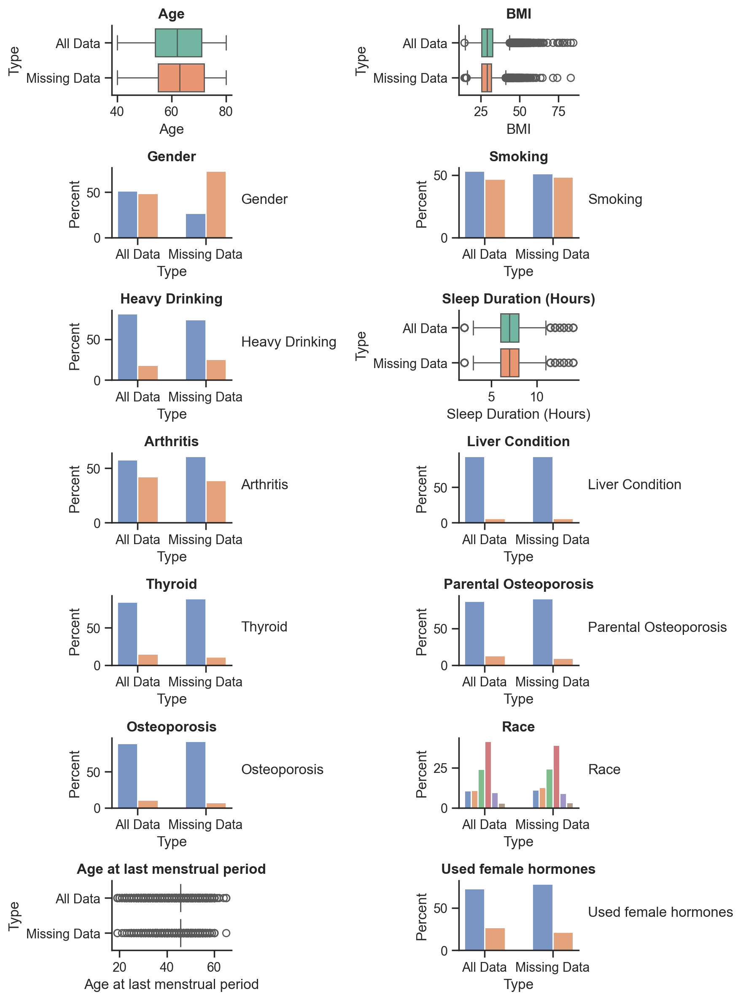

In [124]:
# all data
all_data = df_merged_all.copy()
all_data['Type'] = 'All Data'

# missing data
missing_data = df_merged_all[df_merged_all.isnull().values.any(axis=1)]
missing_data['Type'] = 'Missing Data'

# combined all data and missing values
comparison = pd.concat([all_data, missing_data])
comparison = comparison.reset_index()
comparison.drop(columns=['index'], inplace=True)

# histplot of all data vs. missing data
plt.figure(figsize=(9, 12))
# plot by desired order
var_list = ['Age', 'BMI', 'Gender', 'Smoking', 
            'Heavy Drinking', 'Sleep Duration (Hours)', 'Arthritis', 
            'Liver Condition', 'Thyroid','Parental Osteoporosis', 'Osteoporosis', 'Race', 'Age at last menstrual period', 'Used female hormones']
            #'Femoral neck BMD', 'Lumbar Spine BMD']
compare_distribution(data=comparison, compare_col='Type', var_list=var_list)

In [125]:
# remove missing values
df_merged_all = df_merged_all.dropna()
df_merged_all.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2944 entries, 4 to 25729
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Age                           2944 non-null   float64 
 1   Gender                        2944 non-null   category
 2   Race                          2944 non-null   category
 3   BMI                           2944 non-null   float64 
 4   Smoking                       2944 non-null   category
 5   Heavy Drinking                2944 non-null   category
 6   Sleep Duration (Hours)        2944 non-null   float64 
 7   Arthritis                     2944 non-null   category
 8   Liver Condition               2944 non-null   category
 9   Thyroid                       2944 non-null   category
 10  Parental Osteoporosis         2944 non-null   category
 11  Osteoporosis                  2944 non-null   category
 12  Age at last menstrual period  2944 non-null   float6

In [126]:
df_merged_all.describe()

,Age,BMI,Sleep Duration (Hours),Age at last menstrual period
count,2944.000,2944.000,2944.000,2944.000
mean,61.653,30.716,7.362,45.658
std,10.764,8.007,1.620,7.332
min,40.000,14.200,2.000,19.000
25%,54.000,25.200,6.000,42.000
50%,61.000,29.500,7.500,45.712
75%,70.000,34.700,8.000,50.000
max,80.000,84.400,14.000,65.000


In [127]:
def get_iqr_outliers(data, features):
    data_features = data[features]
    
    # calculate the quartiles and IQR for each feature
    q1 = data_features.quantile(0.25)
    q3 = data_features.quantile(0.75)
    iqr = q3 - q1

    # calculate the lower and upper fences for each feature
    lif = q1 - 1.5 * iqr
    uif = q3 + 1.5 * iqr
    
    # identify outliers for any feature
    outliers_features = data_features[(data_features < lif) | (data_features > uif)].dropna(how='all')
    # get index of outliers
    outlier_index = list(outliers_features.index.values)
    # get values of all features of those outliers
    outliers = data.loc[outlier_index]
    
    return outliers

features = ['BMI', 'Sleep Duration (Hours)', 'Age at last menstrual period']
outliers = get_iqr_outliers(df_merged_all, features)

# remove outliers
df_merged = pd.concat([df_merged_all, outliers]).drop_duplicates(keep=False)
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2693 entries, 4 to 25729
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Age                           2693 non-null   float64 
 1   Gender                        2693 non-null   category
 2   Race                          2693 non-null   category
 3   BMI                           2693 non-null   float64 
 4   Smoking                       2693 non-null   category
 5   Heavy Drinking                2693 non-null   category
 6   Sleep Duration (Hours)        2693 non-null   float64 
 7   Arthritis                     2693 non-null   category
 8   Liver Condition               2693 non-null   category
 9   Thyroid                       2693 non-null   category
 10  Parental Osteoporosis         2693 non-null   category
 11  Osteoporosis                  2693 non-null   category
 12  Age at last menstrual period  2693 non-null   float6

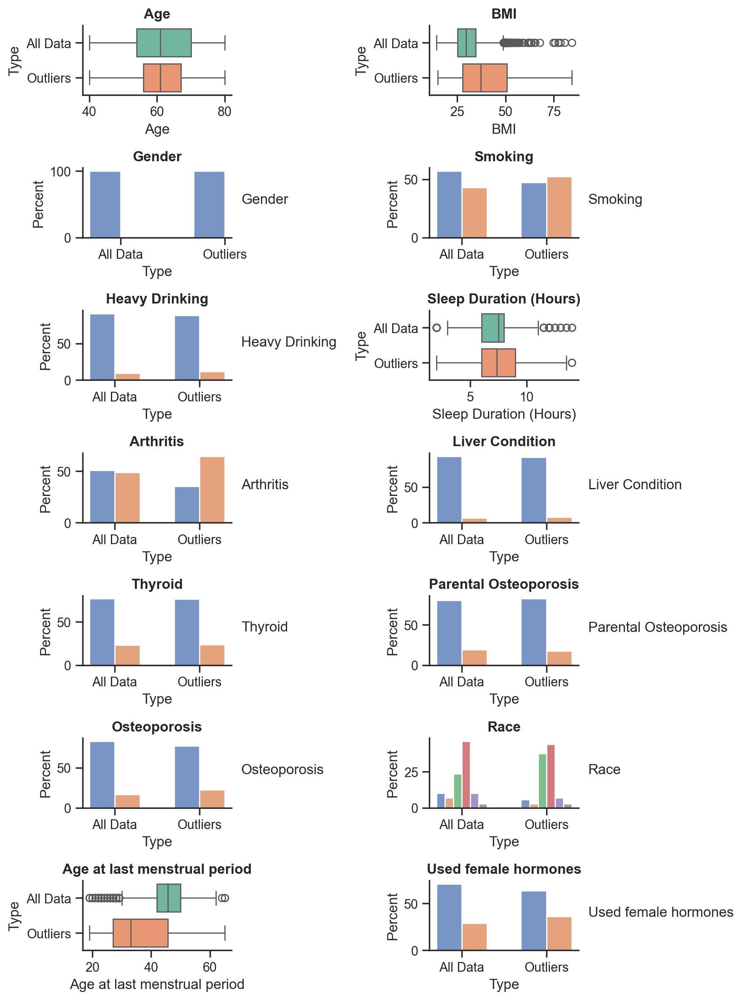

In [128]:
# Data before removing outliers
all_data = df_merged_all.copy()
all_data['Type'] = 'All Data'

# Outliers
outliers['Type'] = 'Outliers'

# combine them
comparison = pd.concat([all_data, outliers])
comparison = comparison.reset_index()
comparison.drop(columns=['index'], inplace=True)

# histplot of all data vs. missing data
plt.figure(figsize=(9, 12))
compare_distribution(comparison, compare_col='Type', var_list=var_list)

In [129]:
df_merged.to_csv("data/cleaned_survey.csv", index=False)

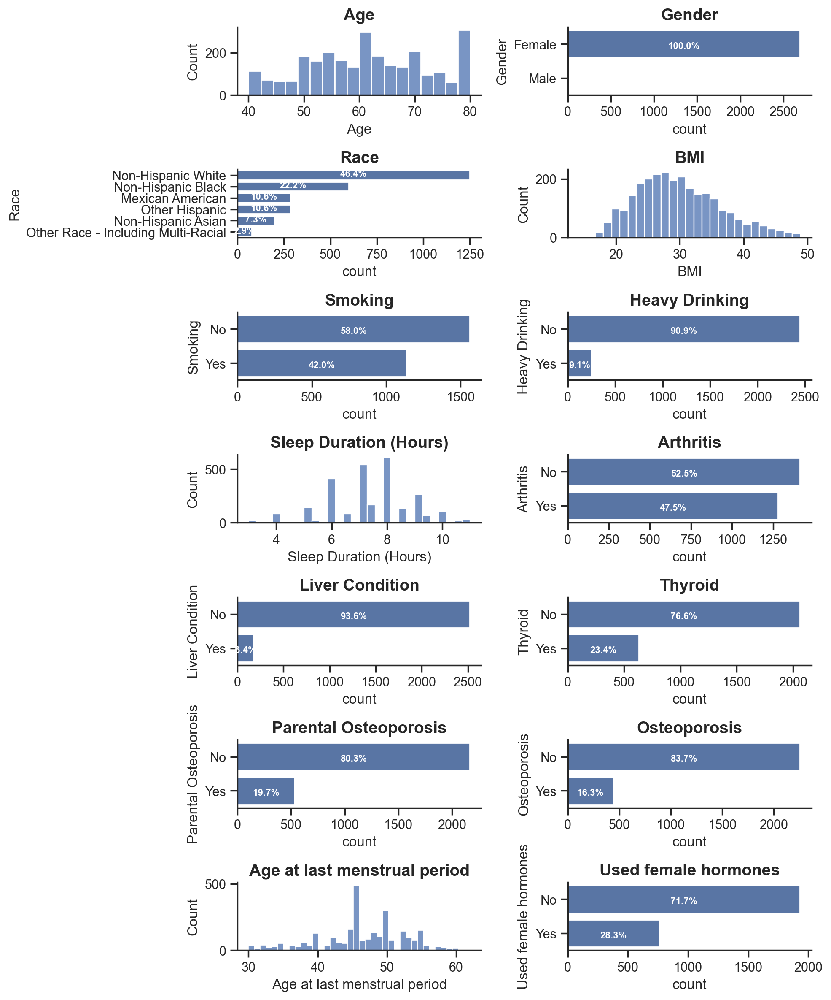

In [130]:
plt.figure(figsize=(10, 12))
multi_countplot(df_merged, var_list=df_merged.columns.tolist())

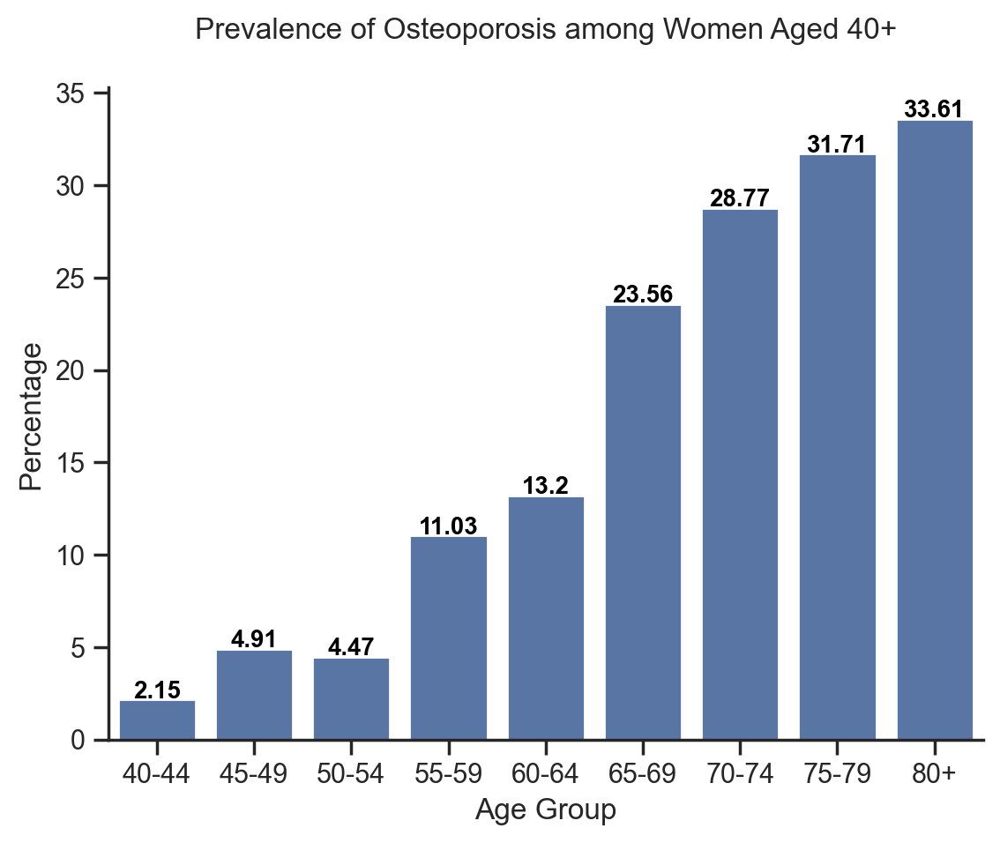

In [131]:
df_age_group = number_to_category(df_merged, var_col='Age', new_var_col='Age Group')
barplot_percentage(df_age_group, 
                   var_col='Age Group', 
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis among Women Aged 40+')
plt.show()

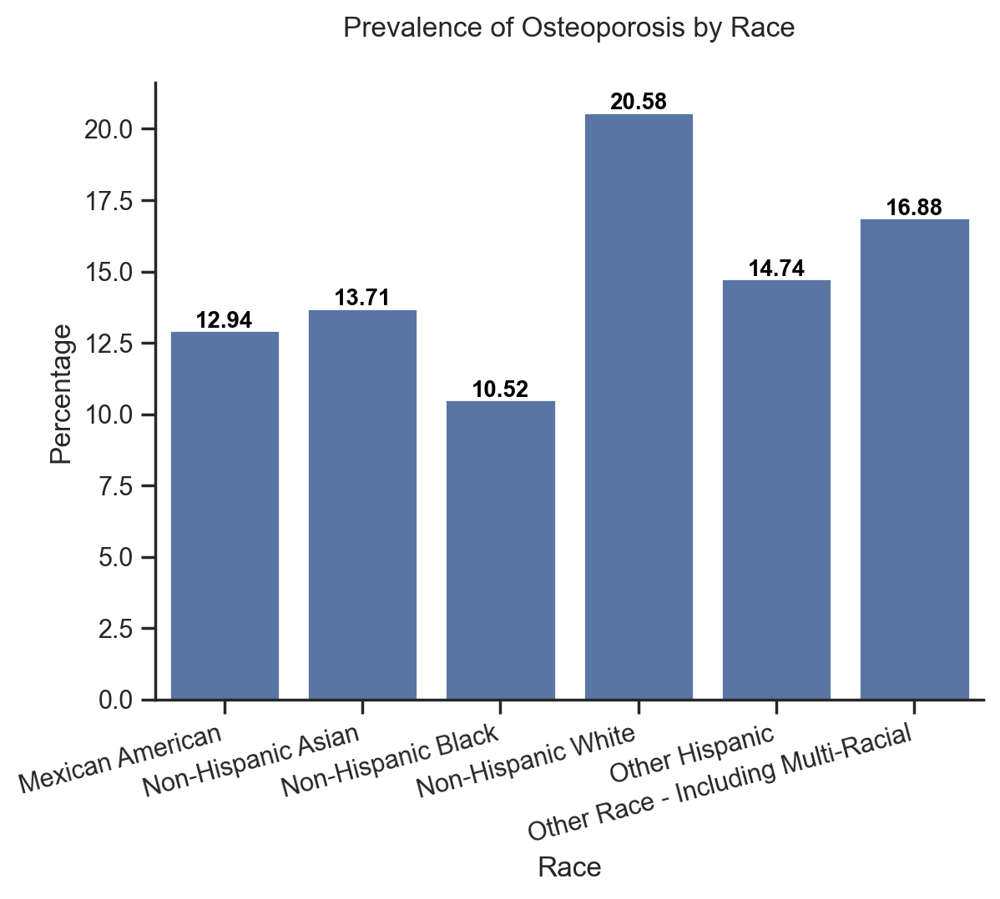

In [132]:
ax = barplot_percentage(df_merged, 
                   var_col='Race', 
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis by Race')
ax.set_xticklabels(ax.get_xticklabels(), rotation=15, horizontalalignment='right')
plt.show()

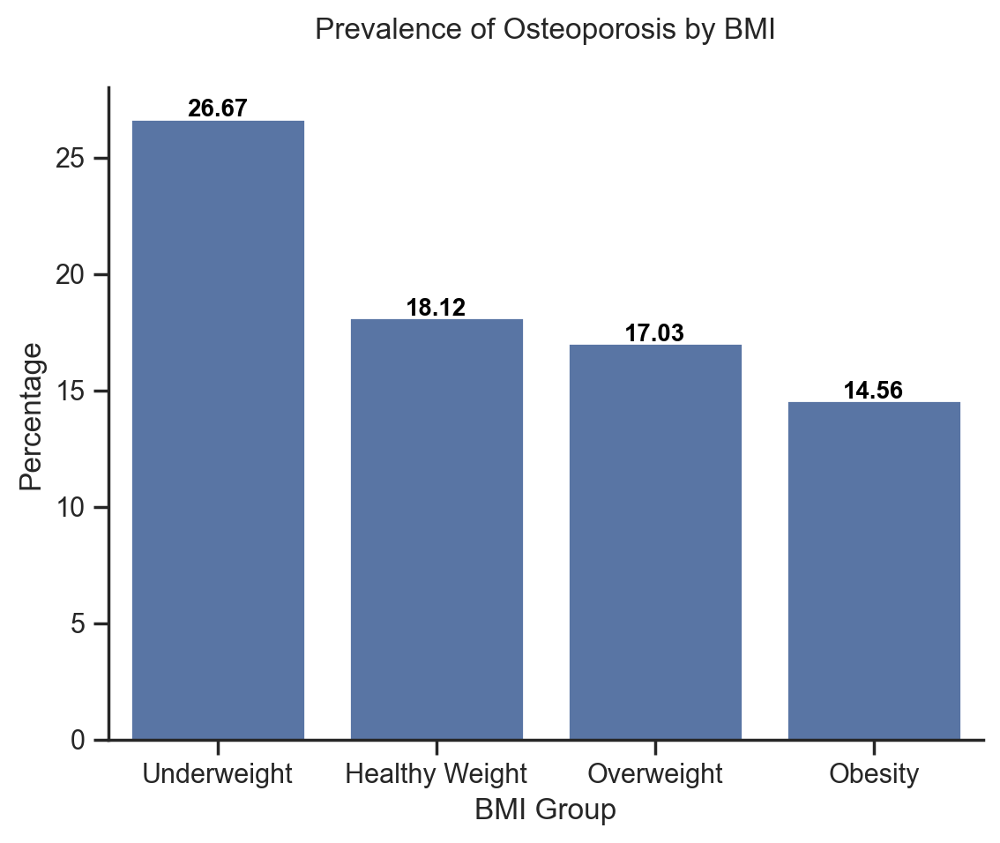

In [133]:
df_bmi_group = number_to_category(df_merged, var_col='BMI', new_var_col='BMI Group')
bmi_order = ['Underweight', 'Healthy Weight', 'Overweight', 'Obesity']
barplot_percentage(df_bmi_group,
                   var_col='BMI Group', 
                   target_col='Osteoporosis',
                   order = bmi_order,
                   title='Prevalence of Osteoporosis by BMI')
plt.show()

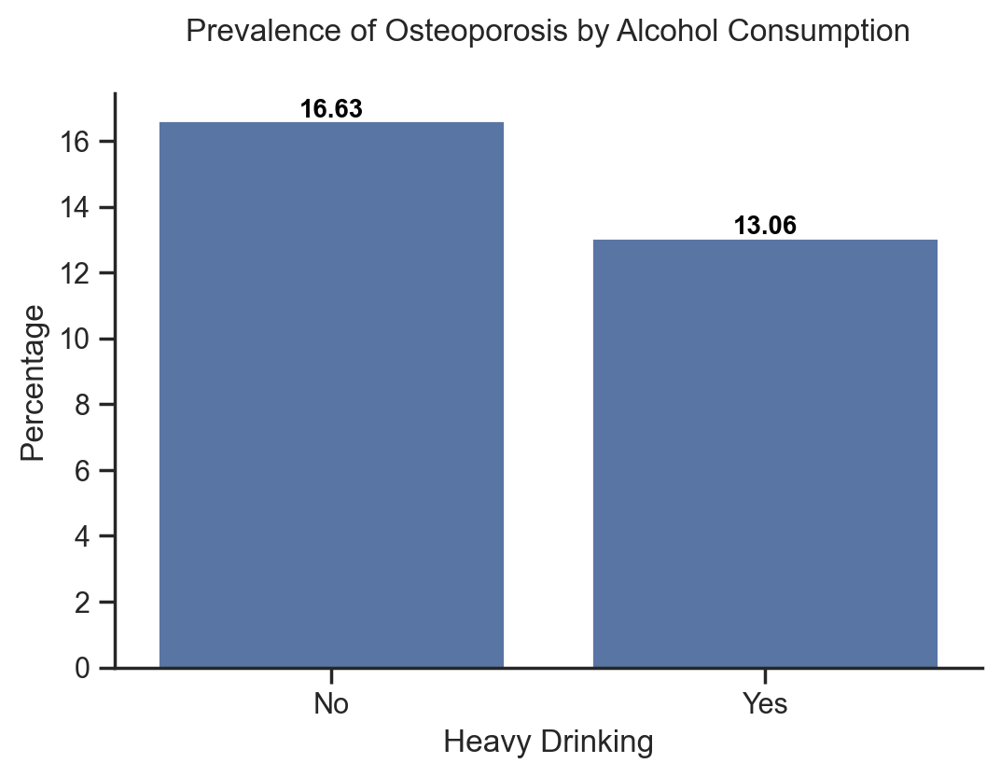

In [134]:
plt.figure(figsize=(6, 4))
barplot_percentage(df_merged,
                   var_col='Heavy Drinking',
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis by Alcohol Consumption'
                  )
plt.show()

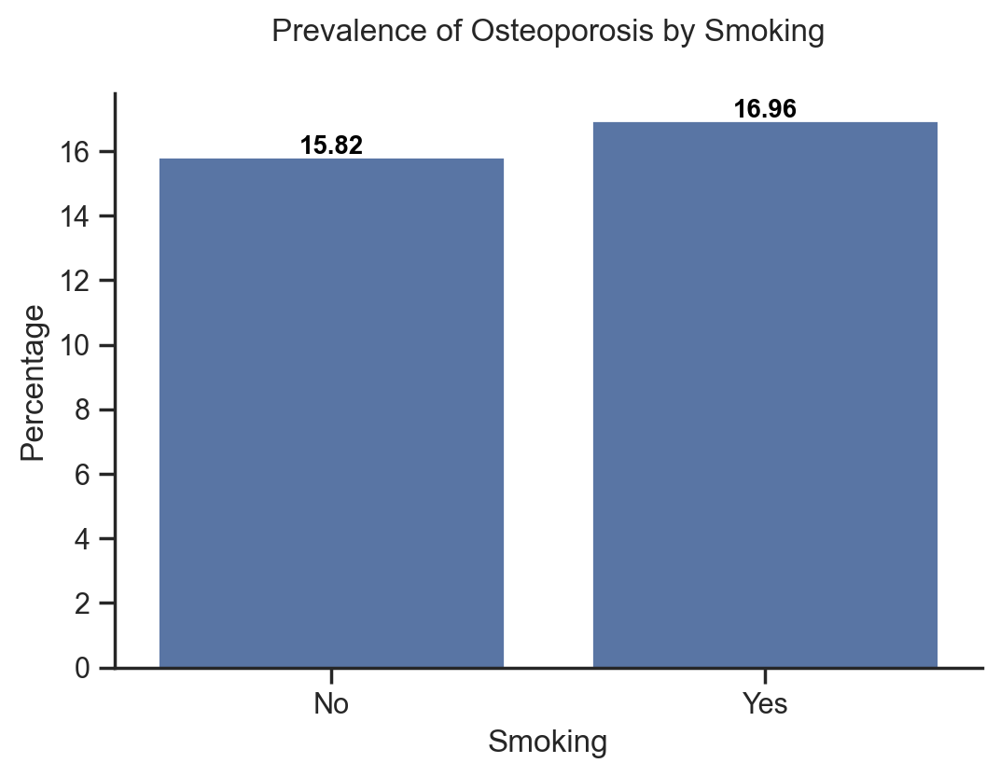

In [135]:
plt.figure(figsize=(6, 4))
barplot_percentage(df_merged,
                   var_col='Smoking',
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis by Smoking'
                  )
plt.show()

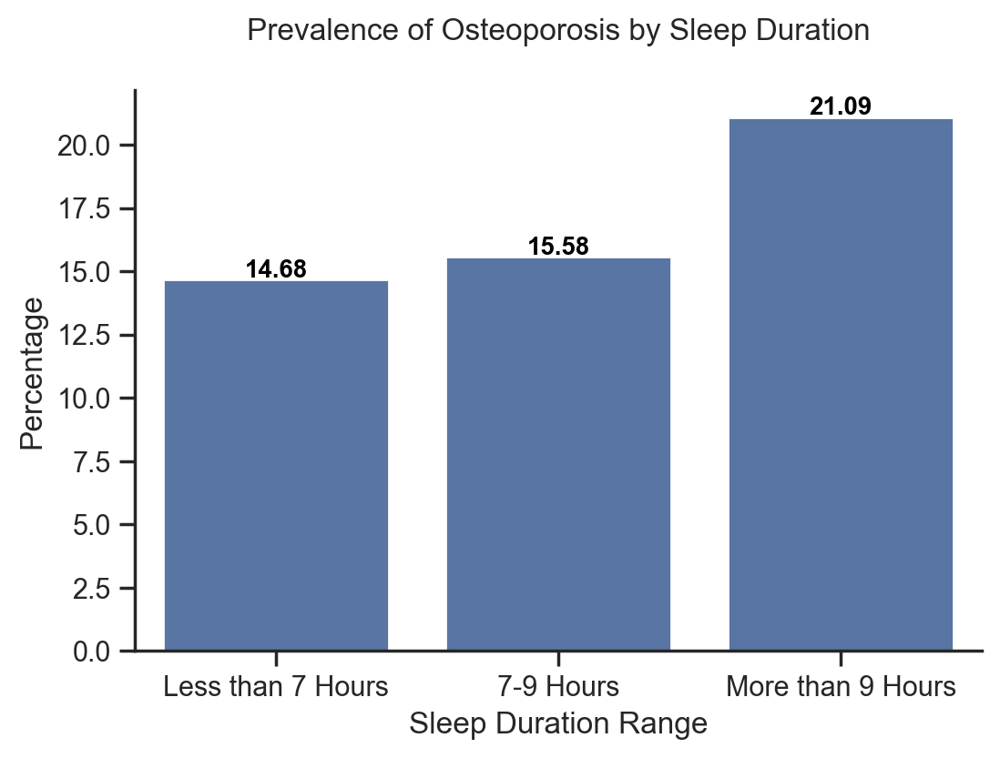

In [136]:
df_sleep_group = number_to_category(df_merged, var_col='Sleep Duration (Hours)', new_var_col='Sleep Duration Range')
sleep_order = ['Less than 7 Hours', '7-9 Hours', 'More than 9 Hours']
plt.figure(figsize=(6, 4))
barplot_percentage(df_sleep_group, 
                   var_col='Sleep Duration Range', 
                   target_col='Osteoporosis',
                   order = sleep_order,
                   title='Prevalence of Osteoporosis by Sleep Duration')
plt.show()

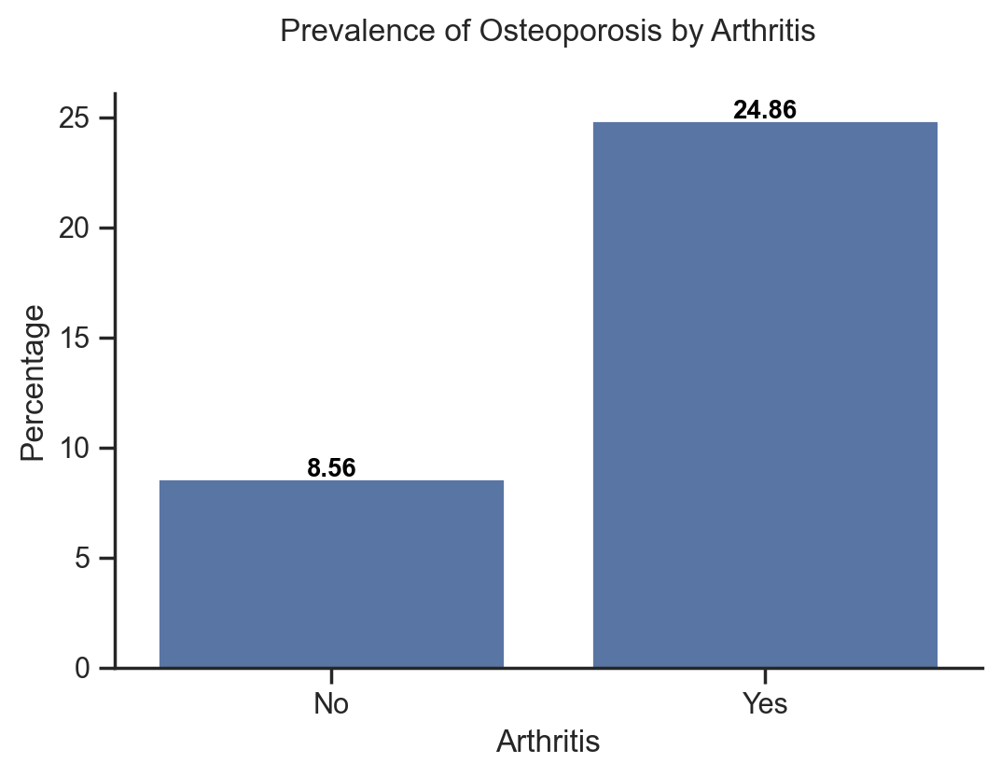

In [137]:
plt.figure(figsize=(6, 4))
barplot_percentage(df_merged,
                   var_col='Arthritis',
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis by Arthritis'
                  )
plt.show()

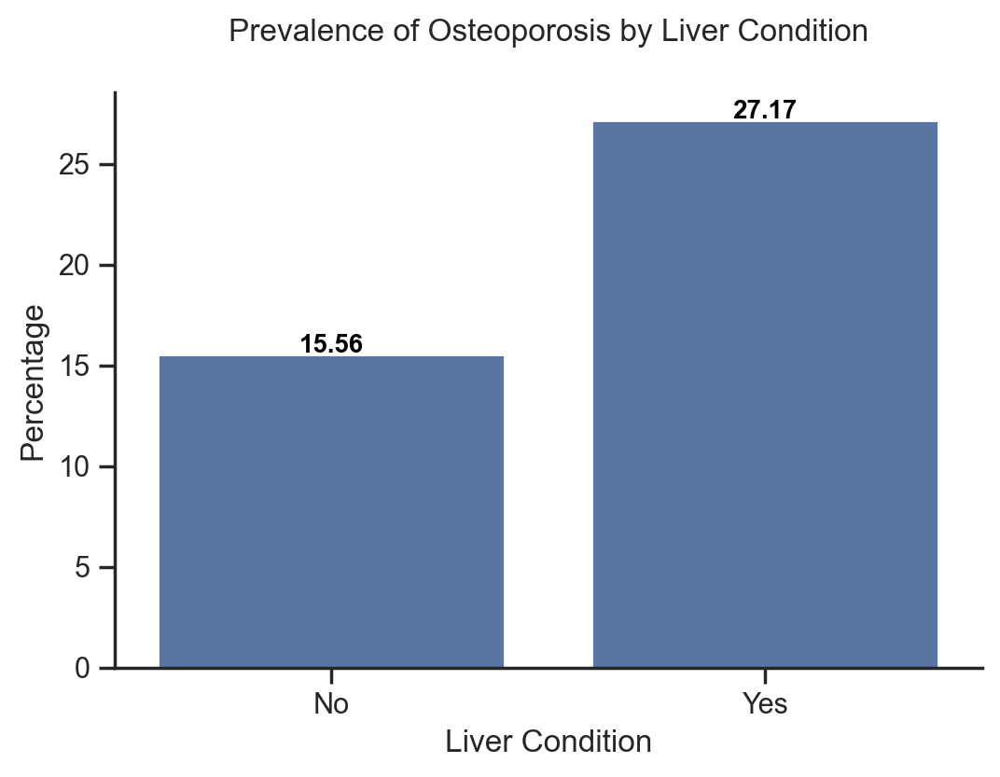

In [138]:
plt.figure(figsize=(6, 4))
barplot_percentage(df_merged,
                   var_col='Liver Condition',
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis by Liver Condition'
                  )
plt.show()

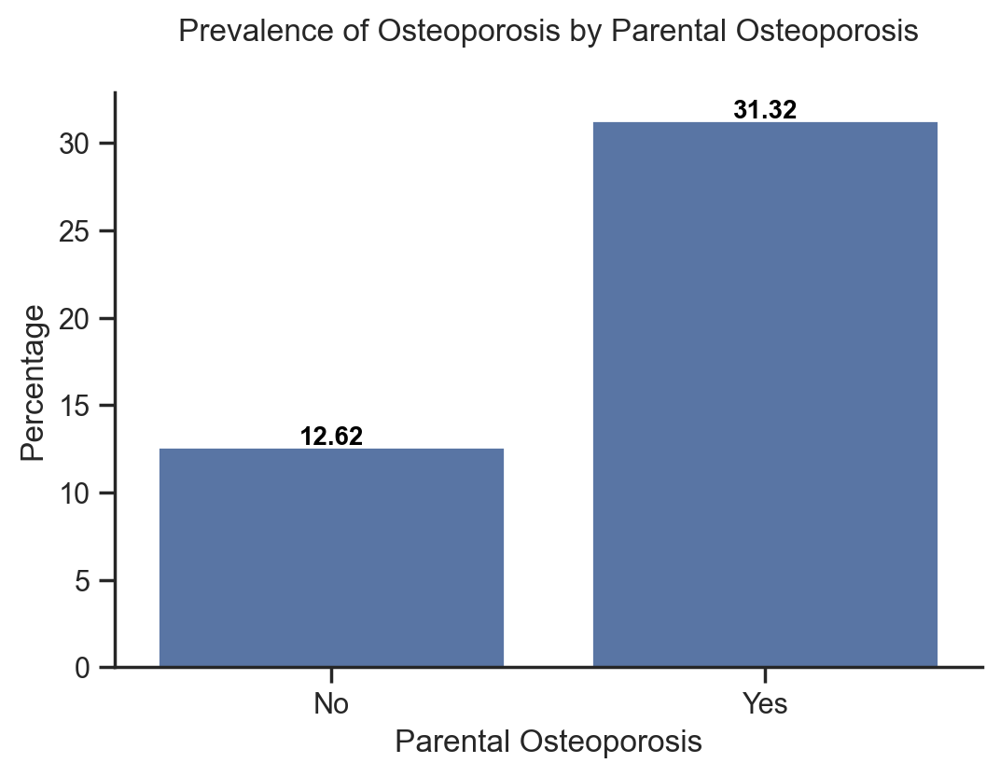

In [139]:
plt.figure(figsize=(6, 4))
barplot_percentage(df_merged,
                   var_col='Parental Osteoporosis',
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis by Parental Osteoporosis'
                  )
plt.show()

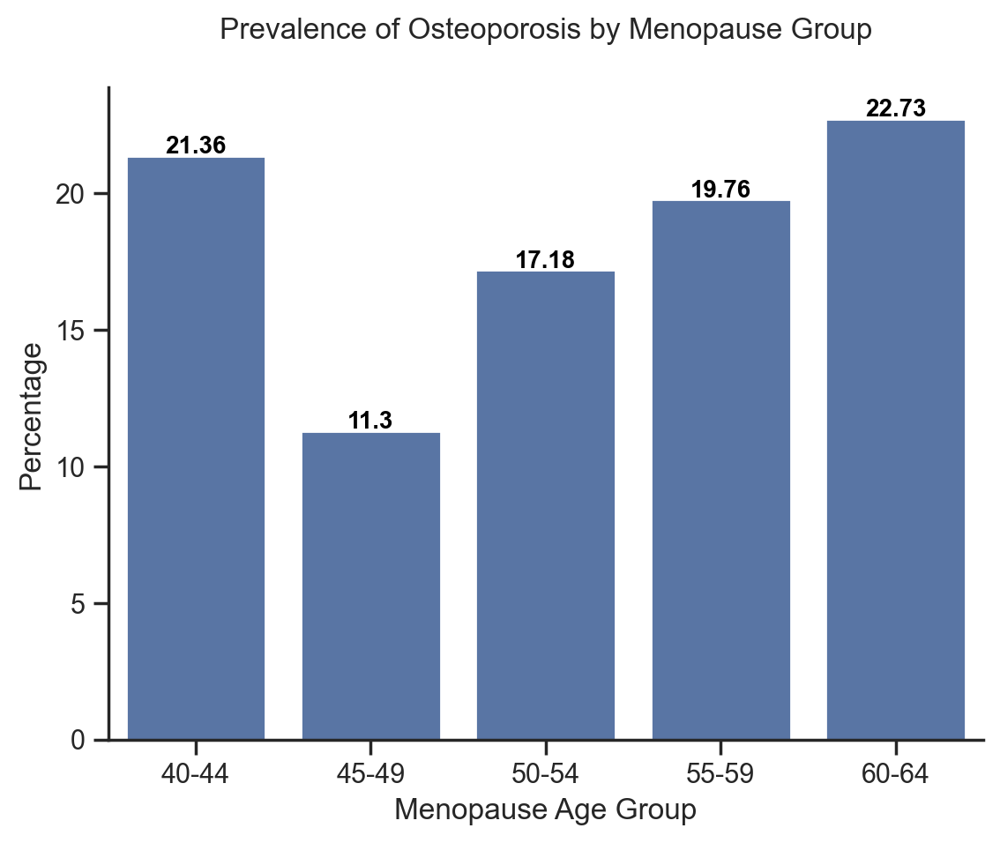

In [140]:
df_menopause_group = number_to_category(df_merged, var_col='Age at last menstrual period', new_var_col='Menopause Age Group')
barplot_percentage(df_menopause_group, 
                   var_col='Menopause Age Group', 
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis by Menopause Group')
plt.show()

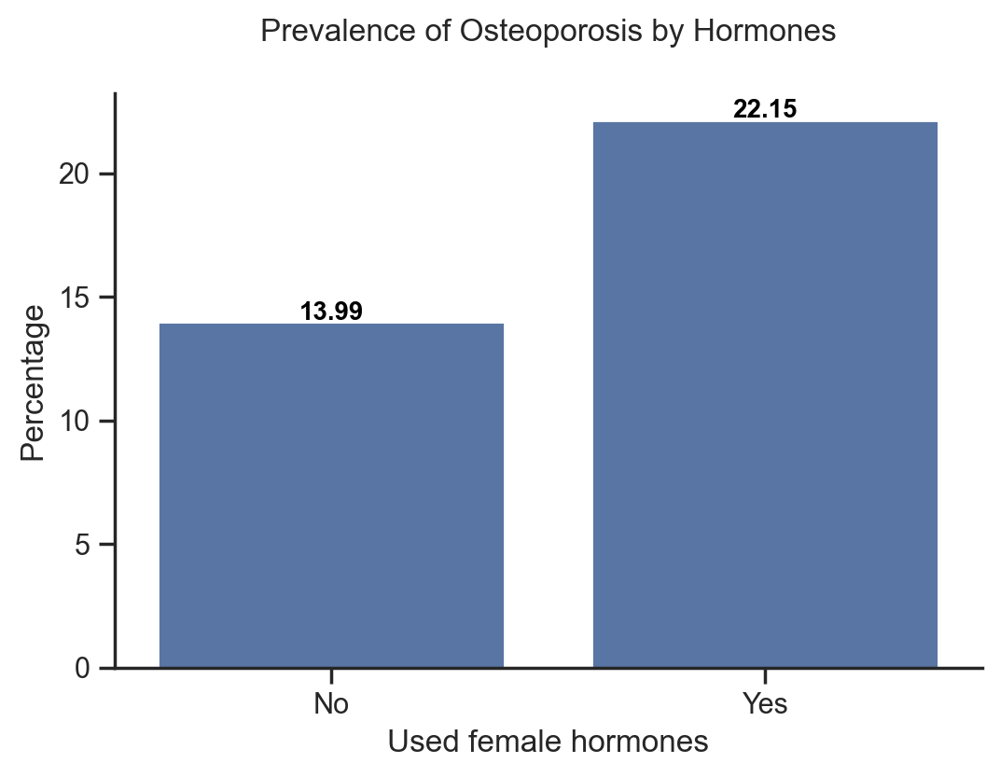

In [141]:
plt.figure(figsize=(6, 4))
barplot_percentage(df_merged,
                   var_col='Used female hormones',
                   target_col='Osteoporosis',
                   title='Prevalence of Osteoporosis by Hormones'
                  )
plt.show()

In [142]:
df_merged.head()

,Age,Gender,Race,BMI,Smoking,Heavy Drinking,Sleep Duration (Hours),Arthritis,Liver Condition,Thyroid,Parental Osteoporosis,Osteoporosis,Age at last menstrual period,Used female hormones
4,73.0,Female,Non-Hispanic White,19.7,No,No,9.0,Yes,No,Yes,No,No,45.000,Yes
7,61.0,Female,Non-Hispanic White,35.7,No,No,9.0,Yes,No,No,No,No,50.000,No
9,56.0,Female,Non-Hispanic White,26.5,Yes,No,6.0,Yes,No,No,No,No,44.000,No
39,57.0,Female,Non-Hispanic Asian,38.3,Yes,No,7.0,No,No,Yes,No,No,54.000,No
40,50.0,Female,Non-Hispanic Black,32.0,No,No,6.0,No,No,No,No,No,45.712,No


In [143]:
def one_hot_encode(data):
    cate_list = list(data.select_dtypes(include=['category', 'object']).columns)
    data_encoded = pd.get_dummies(data, columns=cate_list, prefix_sep='_')
    # drop columns end with '_No'
    data_encoded = data_encoded[data_encoded.columns.drop(list(data_encoded.filter(regex='_No$')))]
    # remove '_Yes', 'Gender_', and 'Race_' from column names
    data_encoded.columns = data_encoded.columns.str.replace("_Yes|Gender_|Race_", "", regex=True)
    # drop redundant columns to reduce the impact of multicollinearity
    columns_to_drop = ['Female', 'Male', 'Other Race - Including Multi-Racial']  # Adjust based on your dataset
    columns_to_drop = [col for col in columns_to_drop if col in data_encoded.columns]
    data_encoded = data_encoded.drop(columns=columns_to_drop, errors='ignore')
    
    return data_encoded


df_ohe = one_hot_encode(df_merged)

df_ohe.head()

,Age,BMI,Sleep Duration (Hours),Age at last menstrual period,Mexican American,Non-Hispanic Asian,Non-Hispanic Black,Non-Hispanic White,Other Hispanic,Smoking,Heavy Drinking,Arthritis,Liver Condition,Thyroid,Parental Osteoporosis,Osteoporosis,Used female hormones
4,73.0,19.7,9.0,45.000,False,False,False,True,False,False,False,True,False,True,False,False,True
7,61.0,35.7,9.0,50.000,False,False,False,True,False,False,False,True,False,False,False,False,False
9,56.0,26.5,6.0,44.000,False,False,False,True,False,True,False,True,False,False,False,False,False
39,57.0,38.3,7.0,54.000,False,True,False,False,False,True,False,False,False,True,False,False,False
40,50.0,32.0,6.0,45.712,False,False,True,False,False,False,False,False,False,False,False,False,False


In [144]:
# binning age with 5-year interval
def convert_age(data):
    group = 1
    for x in range(45, 80, 5):
        group += 1
        if x <= data <= x+4:
             return group
    return 0

# binning bmi based on BMI level 
def convert_bmi(data):
    group = 1
    if 18.5 <= data < 25:
        group = 2
    if 25 <= data < 30:
        group = 3
    if data >= 30:
        group = 4
        
    return group

# binning sleep duration
def convert_sleep_hours(data):
    group = 1
    if 7 <= data < 9:
        group = 2
    if data > 9:
        group = 3
        
    return group

df_ohe['Age Group'] = df_merged['Age'].apply(convert_age)
df_ohe['BMI Group'] = df_merged['BMI'].apply(convert_bmi)
df_ohe['Sleep Duration Group'] = df_merged['Sleep Duration (Hours)'].apply(convert_sleep_hours)
df_ohe['Menopause Age Group'] = df_merged['Age at last menstrual period'].apply(convert_age)

In [145]:
mi_scores = make_mi_scores(data=df_ohe, target_name="Osteoporosis")
mi_scores

Age                             3.187e-02
Arthritis                       3.157e-02
Age Group                       2.907e-02
Parental Osteoporosis           1.876e-02
Age at last menstrual period    1.712e-02
Used female hormones            1.187e-02
Menopause Age Group             6.712e-03
Liver Condition                 6.673e-03
Sleep Duration (Hours)          5.977e-03
Non-Hispanic White              4.749e-03
Non-Hispanic Black              2.863e-03
BMI Group                       1.230e-03
Mexican American                7.302e-04
Non-Hispanic Asian              2.939e-04
Sleep Duration Group            2.322e-04
Other Hispanic                  0.000e+00
Smoking                         0.000e+00
BMI                             0.000e+00
Thyroid                         0.000e+00
Heavy Drinking                  0.000e+00
Name: MI Scores, dtype: float64

In [146]:
# keep Age, BMI Group, Sleep Duration Group, delete Age Group, BMI, and Sleep Duration
df_ohe = df_ohe.drop(columns=['Age Group', 'BMI', 'Sleep Duration (Hours)','Menopause Age Group'])

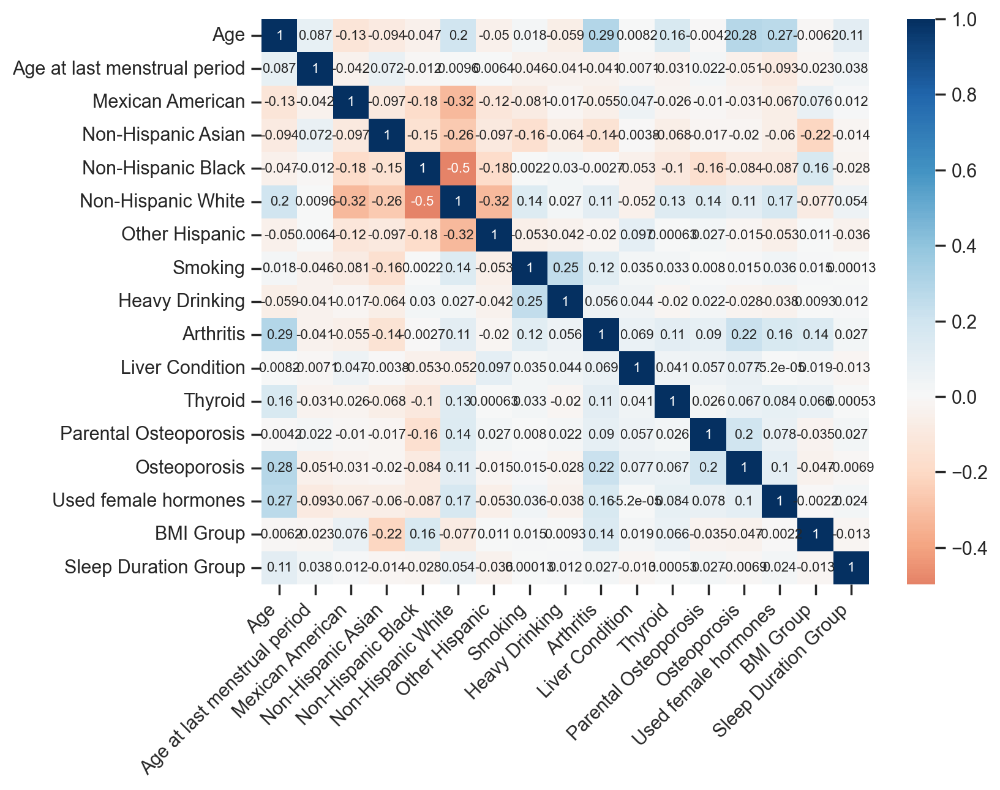

In [147]:
plt.figure(figsize=(8, 6))
chart = sns.heatmap(data=df_ohe.corr(), annot=True, annot_kws={"fontsize":8}, center=0, cmap="RdBu")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

In [148]:
df_ohe.head()

,Age,Age at last menstrual period,Mexican American,Non-Hispanic Asian,Non-Hispanic Black,Non-Hispanic White,Other Hispanic,Smoking,Heavy Drinking,Arthritis,Liver Condition,Thyroid,Parental Osteoporosis,Osteoporosis,Used female hormones,BMI Group,Sleep Duration Group
4,73.0,45.000,False,False,False,True,False,False,False,True,False,True,False,False,True,2,1
7,61.0,50.000,False,False,False,True,False,False,False,True,False,False,False,False,False,4,1
9,56.0,44.000,False,False,False,True,False,True,False,True,False,False,False,False,False,3,1
39,57.0,54.000,False,True,False,False,False,True,False,False,False,True,False,False,False,4,2
40,50.0,45.712,False,False,True,False,False,False,False,False,False,False,False,False,False,4,1


In [149]:
# Function to plot histograms for continuous variables
def plot_histograms(df):
    # Histograms for continuous variables relevant to osteoporosis risk
    continuous_vars = ['Age', 'BMI Group']
    df[continuous_vars].hist(bins=30, figsize=(10, 6), color='skyblue', edgecolor='black')
    plt.suptitle('Histograms of Age, BMI Group')
    plt.show()

# Function to plot bar plots for categorical variables
def plot_bar_plots(df):
    categorical_vars = ['Smoking', 'Heavy Drinking', 'Arthritis', 'Liver Condition', 'Thyroid', 'Parental Osteoporosis', 'Used female hormones']
    for cat_var in categorical_vars:
        plt.figure(figsize=(8, 4))
        sns.countplot(data=df, x=cat_var, palette='Set2')
        plt.title(f'Distribution of {cat_var}')
        plt.show()

# Function to plot correlation matrix
def plot_correlation_matrix(df):
    numeric_vars = ['Age', 'BMI Group', 'Sleep Duration Group']
    plt.figure(figsize=(8, 6))
    corr_matrix = df[numeric_vars].corr()
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Matrix')
    plt.show()

# Function to plot box plots for categorical features vs Osteoporosis
def plot_box_plots(df):
    categorical_vars = ['Smoking', 'Heavy Drinking', 'Arthritis', 'Liver Condition', 'Thyroid', 'Parental Osteoporosis', 'Used female hormones']
    for cat_var in categorical_vars:
        plt.figure(figsize=(8, 4))
        sns.boxplot(x=cat_var, y='Age', data=df, palette='Set1')
        plt.title(f'Box Plot of {cat_var} vs Age')
        plt.show()

# Function to plot violin plots for categorical features vs Age
def plot_violin_plots(df):
    categorical_vars = ['Smoking', 'Heavy Drinking', 'Arthritis', 'Liver Condition', 'Thyroid', 'Parental Osteoporosis', 'Used female hormones']
    for cat_var in categorical_vars:
        plt.figure(figsize=(8, 4))
        sns.violinplot(x=cat_var, y='Age', data=df, palette='Set1')
        plt.title(f'Violin Plot of {cat_var} vs Age')
        plt.show()

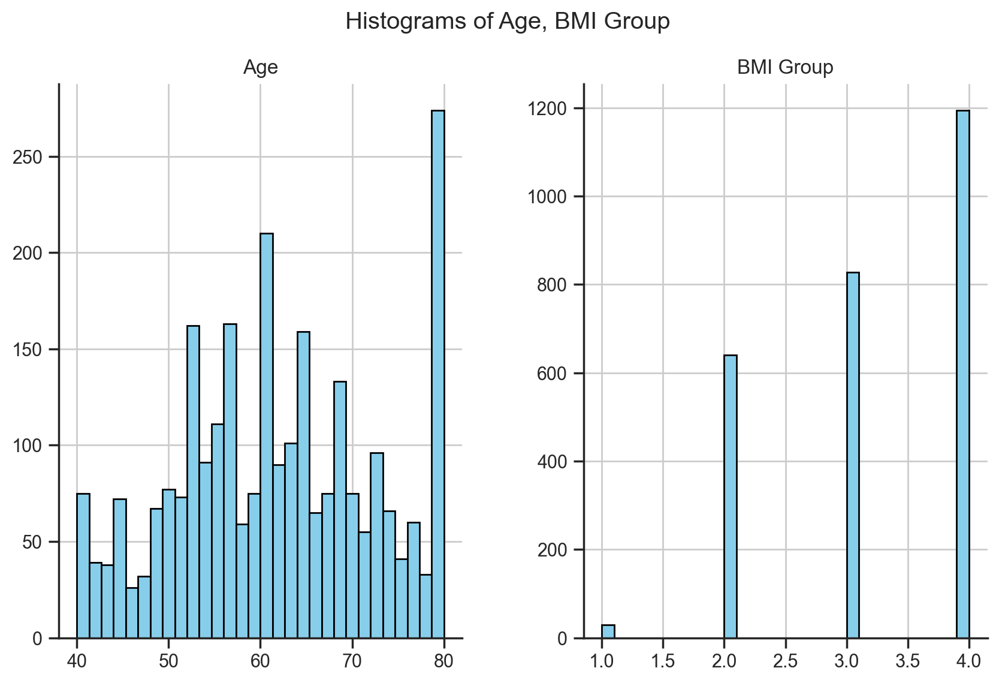

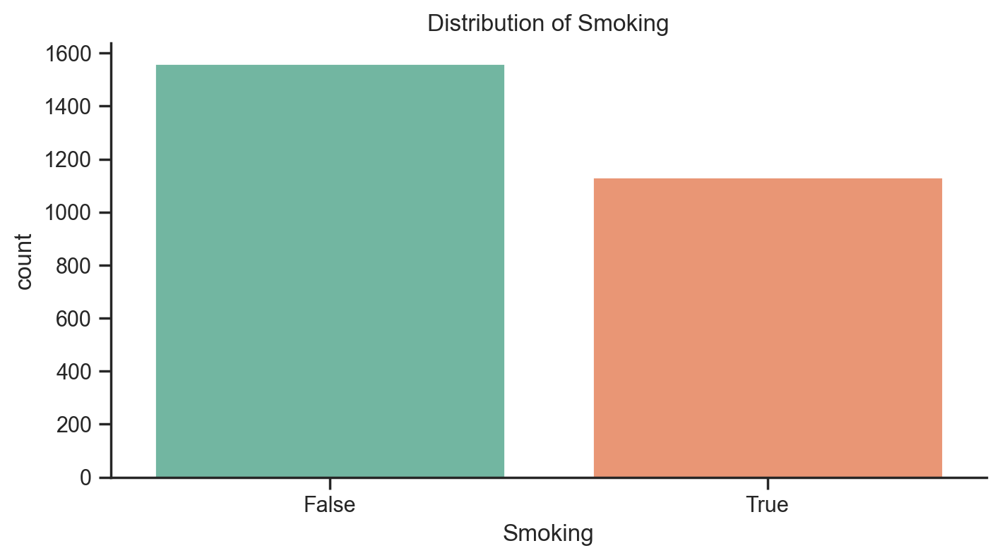

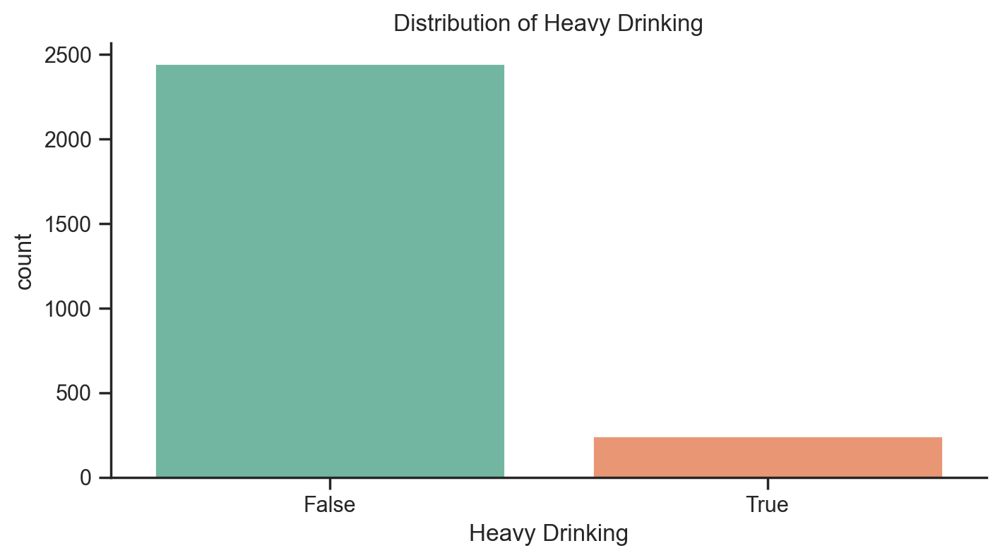

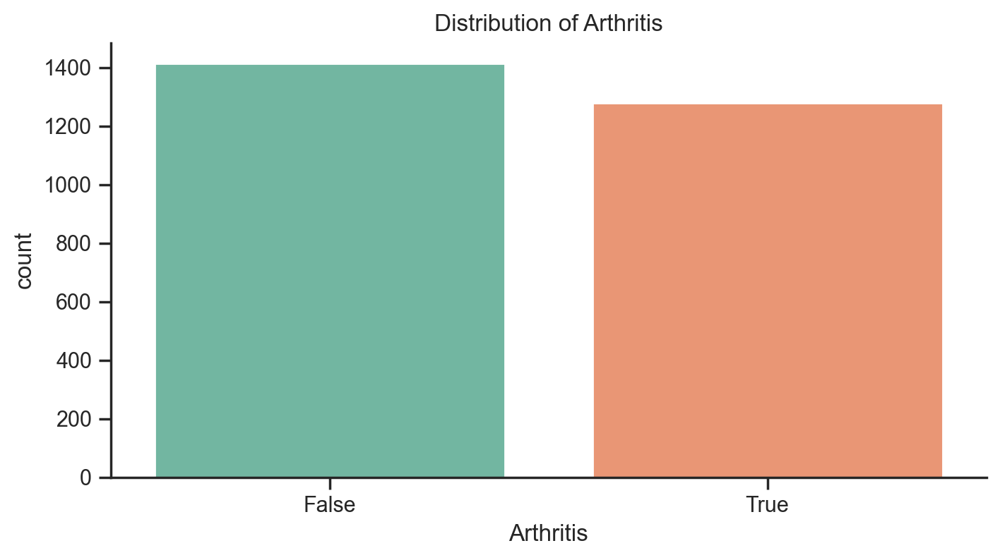

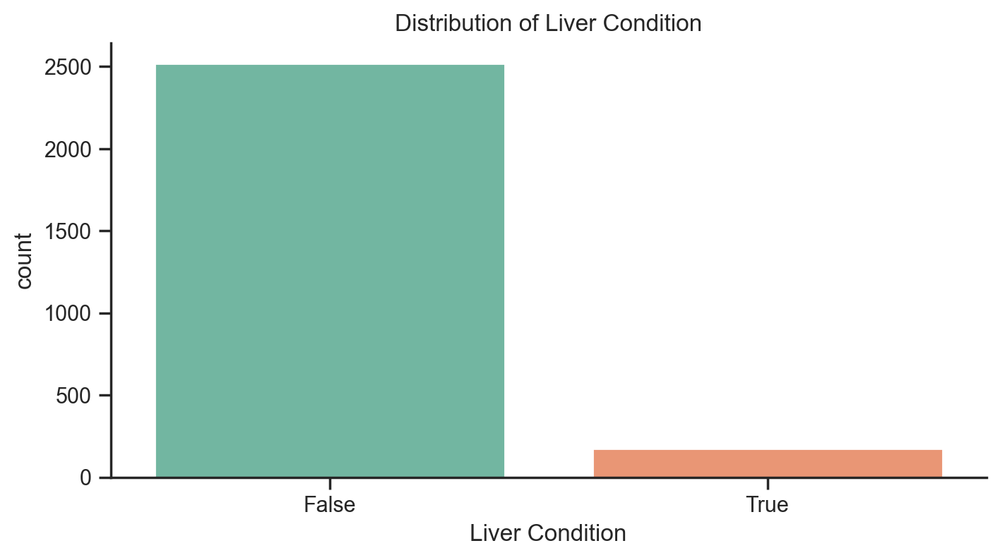

...

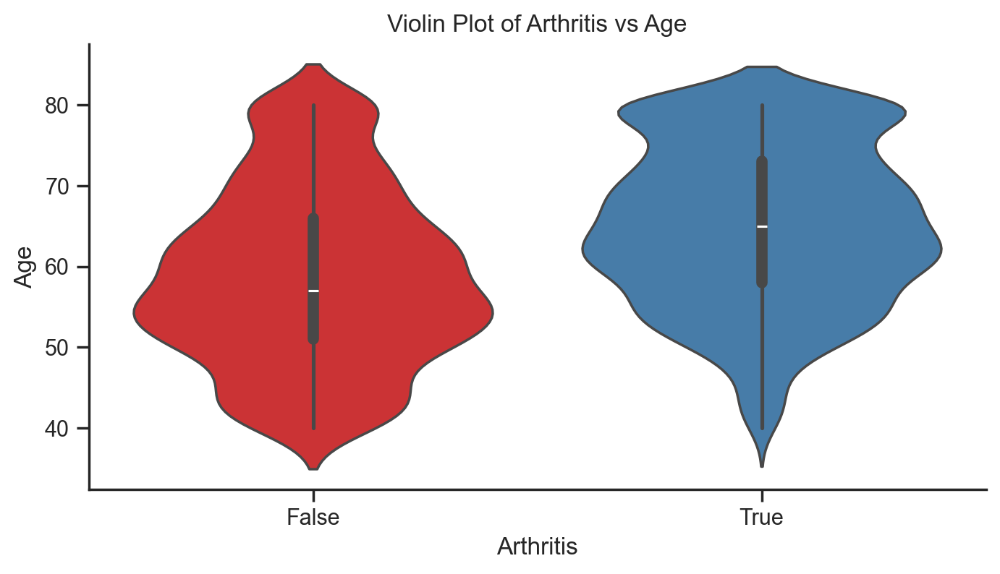

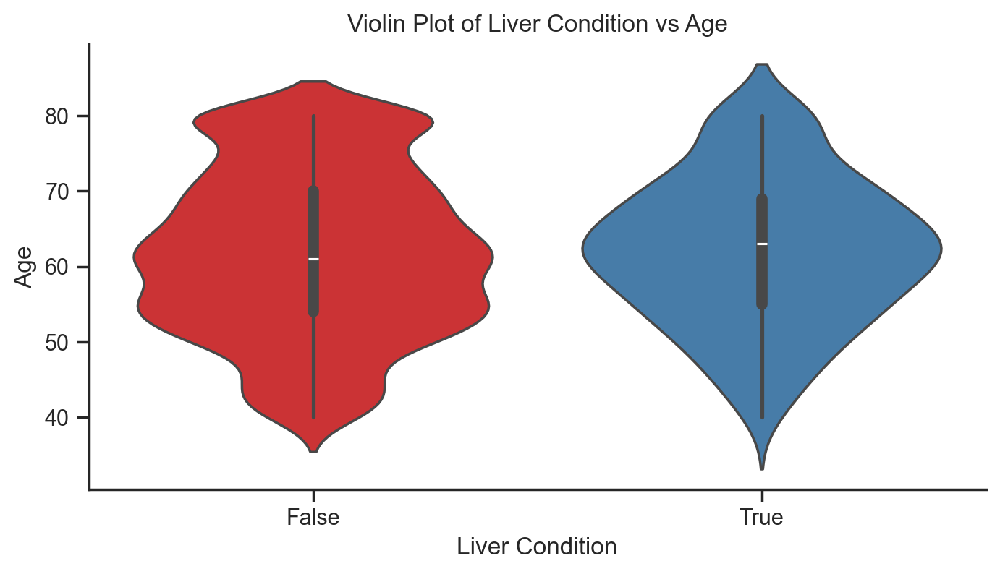

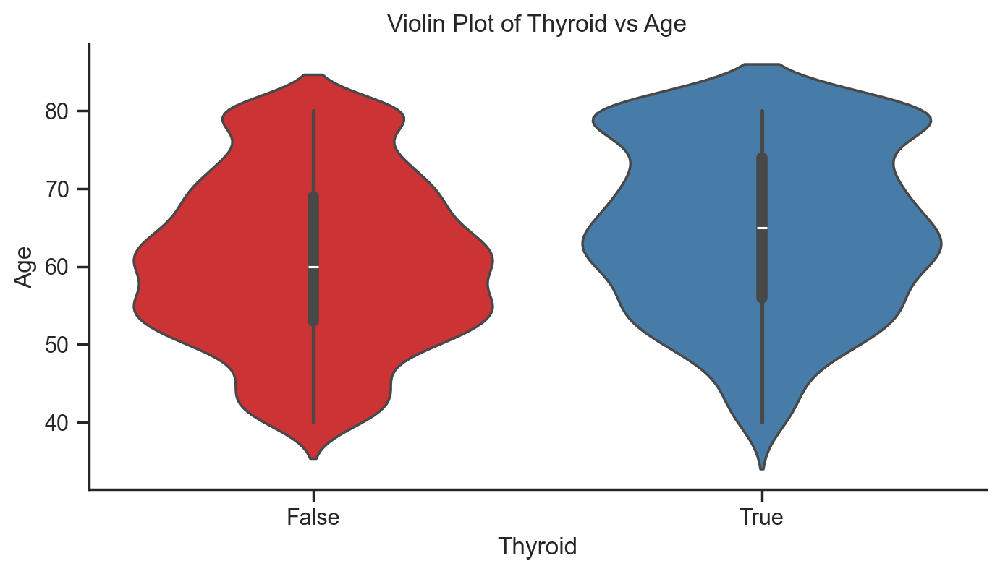

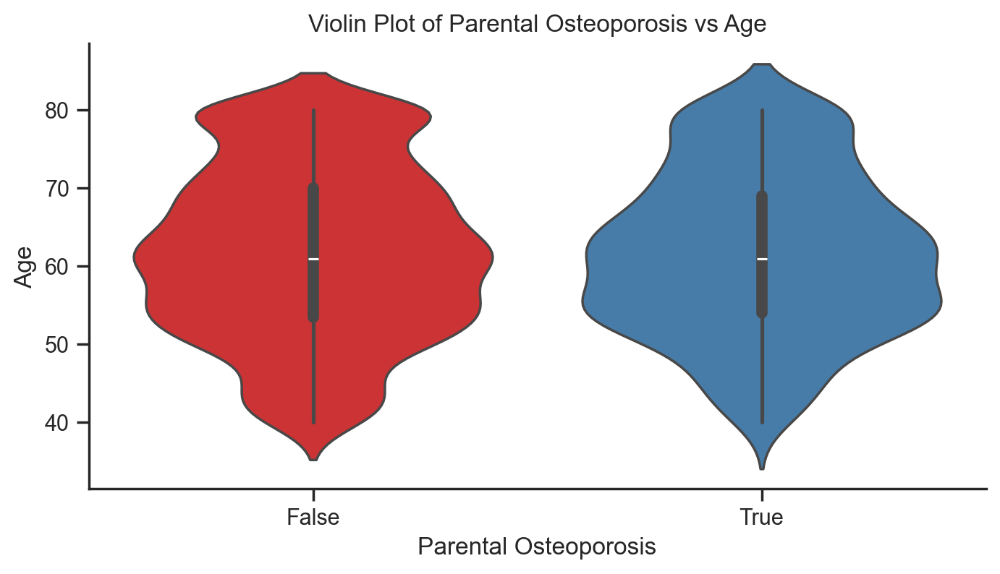

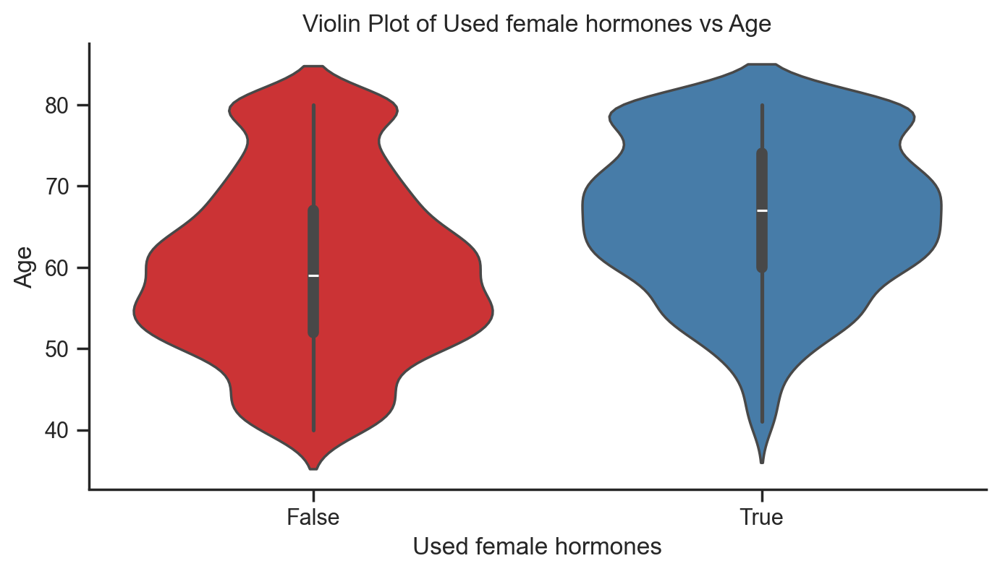

In [150]:
plot_histograms(df_ohe)
plot_bar_plots(df_ohe)
plot_correlation_matrix(df_ohe)
plot_box_plots(df_ohe)
plot_violin_plots(df_ohe)

In [151]:
# get train and test dataset
# standardize train dataset
(
    X_train_ss,
    X_test_ss,
    y_train,
    y_test
) = train_test_standardscaler(
    df_ohe, target_name="Osteoporosis", test_size=0.2, random_state=42
)


In [152]:
# Define the oversampling methods and sampling strategies
oversampling_methods = [ADASYN, SMOTE, SMOTETomek]

# define the oversampling methods and sampling strategies
oversampling_methods = [ADASYN, SMOTE, SMOTETomek]
# resample all classes but the majority class
sampling_strategy = 'not majority'

# compare their performance metrics by Logistic Regression, one of the most common and easy to use classifiers
scores, results = compare_oversampling_performance(X_train=X_train_ss,
                                          y_train=y_train,
                                          X_test=X_test_ss,
                                          y_test=y_test,
                                          model=LogisticRegression,
                                          oversampling_methods=oversampling_methods, 
                                          sampling_strategy=sampling_strategy)

# show the 5 key metrics
performance_metrics = scores[['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC']] 
performance_metrics = performance_metrics.sort_values(by=['F1 Score', 'Recall'], ascending=False)
performance_metrics

,Accuracy,Precision,Recall,F1 Score,AUC
3,0.699,0.329,0.807,0.467,0.831
2,0.690,0.323,0.818,0.463,0.827
1,0.685,0.317,0.807,0.455,0.820
0,0.844,0.600,0.136,0.222,0.837


In [153]:
def SMOTE_Balance(X, Y):
    """Apply SMOTE to balance dataset."""
    smote = SMOTE(random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X, Y)
    return X_resampled, y_resampled

X_train_oversample, y_train_oversample = SMOTE_Balance(X_train_ss, y_train)

# data shapes
print('====== Original ========\n')
print(f'the shape of X_train is: {X_train_ss.shape}')
print(f'the shape of y_train is: {y_train.shape}')
print(f'the shape of X_test is: {X_test_ss.shape}')
print(f'the shape of y_test is: {y_test.shape}')

print('\n====== After oversampling ========\n')
print(f'the shape of X_train is: {X_train_oversample.shape}')
print(f'the shape of y_train is: {y_train_oversample.shape}')
print("y_train before oversampling: ", Counter(y_train))
print("y_train after oversampling: ", Counter(y_train_oversample))

====== Original ========

the shape of X_train is: (2154, 16)
the shape of y_train is: (2154,)
the shape of X_test is: (539, 16)
the shape of y_test is: (539,)

====== After oversampling ========

the shape of X_train is: (3606, 16)
the shape of y_train is: (3606,)
y_train before oversampling:  Counter({False: 1803, True: 351})
y_train after oversampling:  Counter({False: 1803, True: 1803})


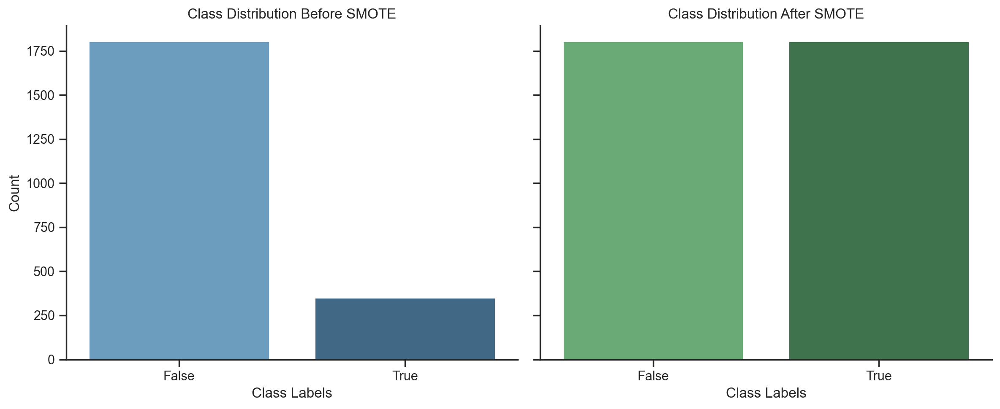

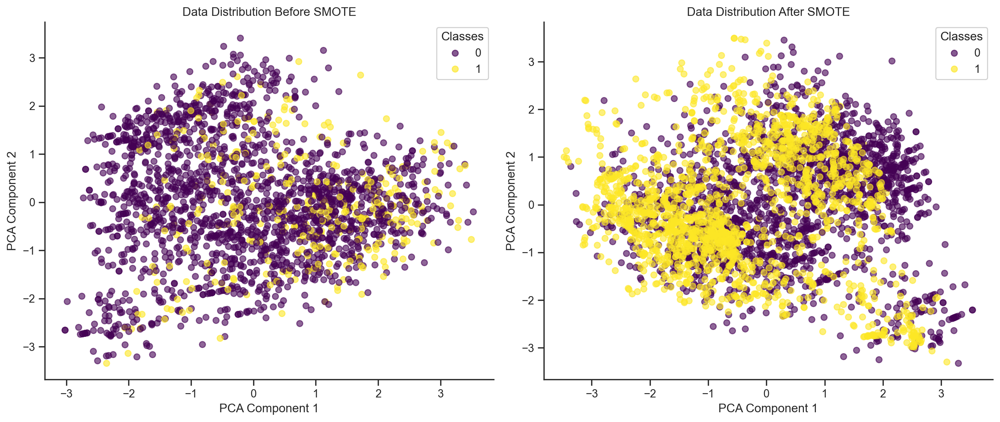

In [154]:
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
import numpy as np

# Function to plot class distribution
def plot_class_distribution(y_before, y_after):
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
    
    # Before SMOTE
    sns.barplot(
        x=list(Counter(y_before).keys()),
        y=list(Counter(y_before).values()),
        ax=axes[0],
        palette="Blues_d"
    )
    axes[0].set_title("Class Distribution Before SMOTE")
    axes[0].set_xlabel("Class Labels")
    axes[0].set_ylabel("Count")
    
    # After SMOTE
    sns.barplot(
        x=list(Counter(y_after).keys()),
        y=list(Counter(y_after).values()),
        ax=axes[1],
        palette="Greens_d"
    )
    axes[1].set_title("Class Distribution After SMOTE")
    axes[1].set_xlabel("Class Labels")
    
    plt.tight_layout()
    plt.show()

# Function to visualize data using PCA
def visualize_pca(X_before, y_before, X_after, y_after):
    pca = PCA(n_components=2, random_state=42)
    
    # Apply PCA to reduce to 2 dimensions
    X_before_2d = pca.fit_transform(X_before)
    X_after_2d = pca.fit_transform(X_after)
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Before SMOTE
    scatter_before = axes[0].scatter(X_before_2d[:, 0], X_before_2d[:, 1], c=y_before, cmap='viridis', alpha=0.6)
    axes[0].set_title("Data Distribution Before SMOTE")
    axes[0].set_xlabel("PCA Component 1")
    axes[0].set_ylabel("PCA Component 2")
    legend1 = axes[0].legend(*scatter_before.legend_elements(), title="Classes")
    axes[0].add_artist(legend1)
    
    # After SMOTE
    scatter_after = axes[1].scatter(X_after_2d[:, 0], X_after_2d[:, 1], c=y_after, cmap='viridis', alpha=0.6)
    axes[1].set_title("Data Distribution After SMOTE")
    axes[1].set_xlabel("PCA Component 1")
    axes[1].set_ylabel("PCA Component 2")
    legend2 = axes[1].legend(*scatter_after.legend_elements(), title="Classes")
    axes[1].add_artist(legend2)
    
    plt.tight_layout()
    plt.show()

# Plot class distribution before and after SMOTE
plot_class_distribution(y_train, y_train_oversample)

# Visualize data distribution using PCA before and after SMOTE
visualize_pca(X_train_ss, y_train, X_train_oversample, y_train_oversample)


In [155]:
X_train_oversample.head()

,Age,Age at last menstrual period,Mexican American,Non-Hispanic Asian,Non-Hispanic Black,Non-Hispanic White,Other Hispanic,Smoking,Heavy Drinking,Arthritis,Liver Condition,Thyroid,Parental Osteoporosis,Used female hormones,BMI Group,Sleep Duration Group
0,0.054,0.887,-0.347,-0.279,-0.540,1.085,-0.344,1.187,-0.311,1.057,-0.262,-0.564,-0.495,1.598,0.977,0.505
1,-0.585,-0.101,-0.347,-0.279,-0.540,1.085,-0.344,-0.842,-0.311,-0.946,-0.262,-0.564,2.020,1.598,-0.222,0.505
2,1.697,2.204,-0.347,-0.279,1.853,-0.921,-0.344,1.187,-0.311,-0.946,-0.262,-0.564,-0.495,1.598,0.977,-1.139
3,-0.676,0.887,-0.347,-0.279,-0.540,1.085,-0.344,1.187,-0.311,1.057,-0.262,-0.564,2.020,-0.626,-1.422,-1.139
4,-0.037,-1.747,-0.347,-0.279,1.853,-0.921,-0.344,-0.842,-0.311,-0.946,-0.262,1.773,-0.495,1.598,-0.222,0.505


In [156]:
lr_model = LogisticRegression(random_state=42)
lr_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_lr = lr_model.predict(X_test_ss)

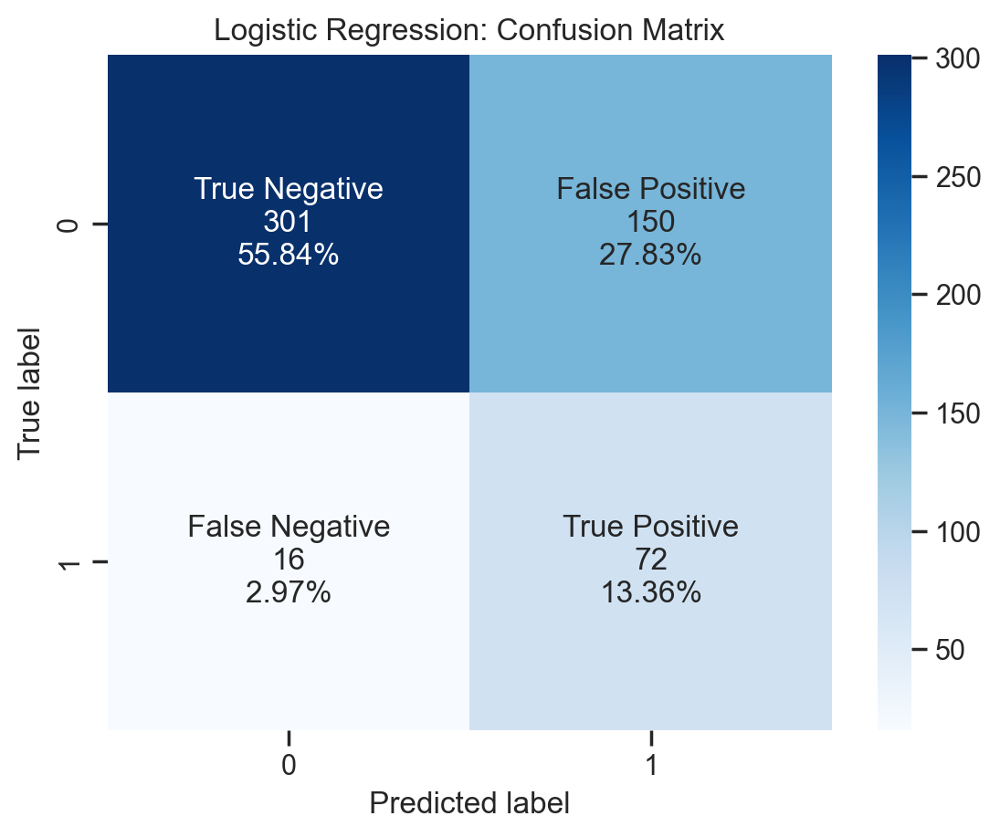

In [157]:
lr_cf_matrix = confusion_matrix(y_test, y_test_predict_lr)
plot_cf_matrix(lr_cf_matrix, model_name="Logistic Regression")
plt.show()

No Skill: ROC AUC=0.5
Logistic Regression: ROC AUC=0.828


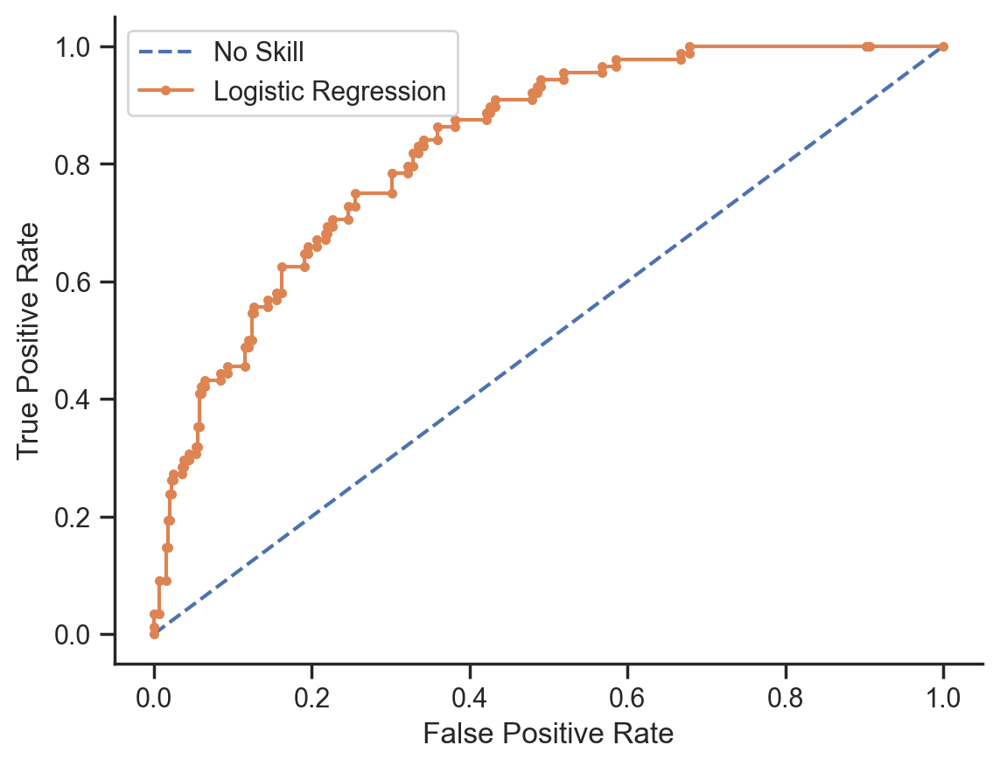

In [158]:
y_test_predict_probs_lr = get_predict_proba(lr_model, X_test_ss)
lr_auc, lr_roc_plot = plot_auc(y_test, y_test_predict_probs_lr, model_name="Logistic Regression")

In [159]:
lr_model_scores = binary_classification_scores(lr_cf_matrix,
                                               auc=lr_auc,
                                               model_name='Logistic Regression')
lr_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
Logistic Regression,0.692,0.324,0.818,0.465,0.828


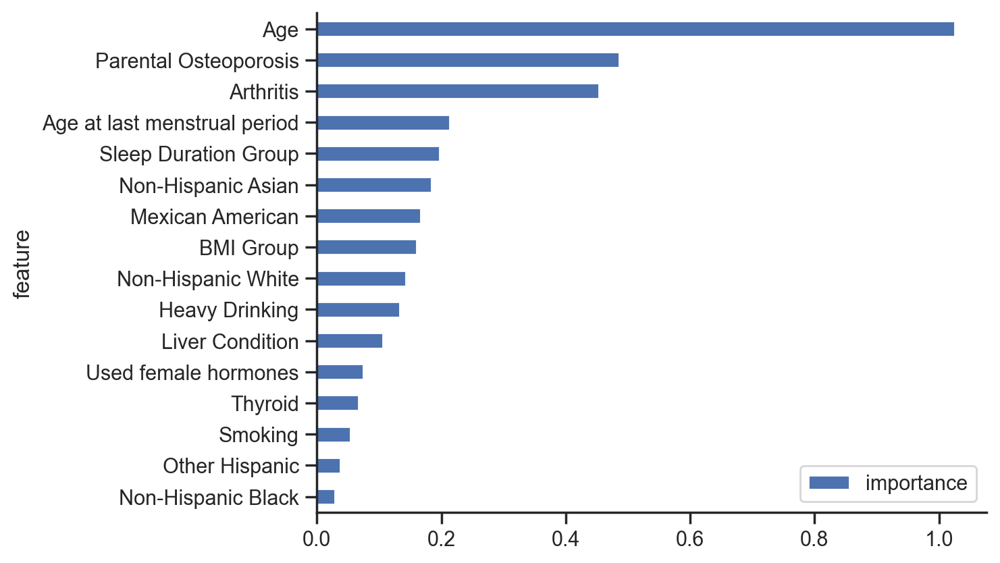

In [160]:
features = X_train_oversample
feature_importance=pd.DataFrame({'feature':list(features.columns),
                                 'importance':[abs(i) for i in lr_model.coef_[0]]})
feature_importance = feature_importance.sort_values('importance',ascending=True)
                               
feature_importance.plot.barh(x='feature', y='importance') 
plt.show()

In [161]:
svm_model = SVC(probability=True, random_state=42)
svm_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_svm = svm_model.predict(X_test_ss)

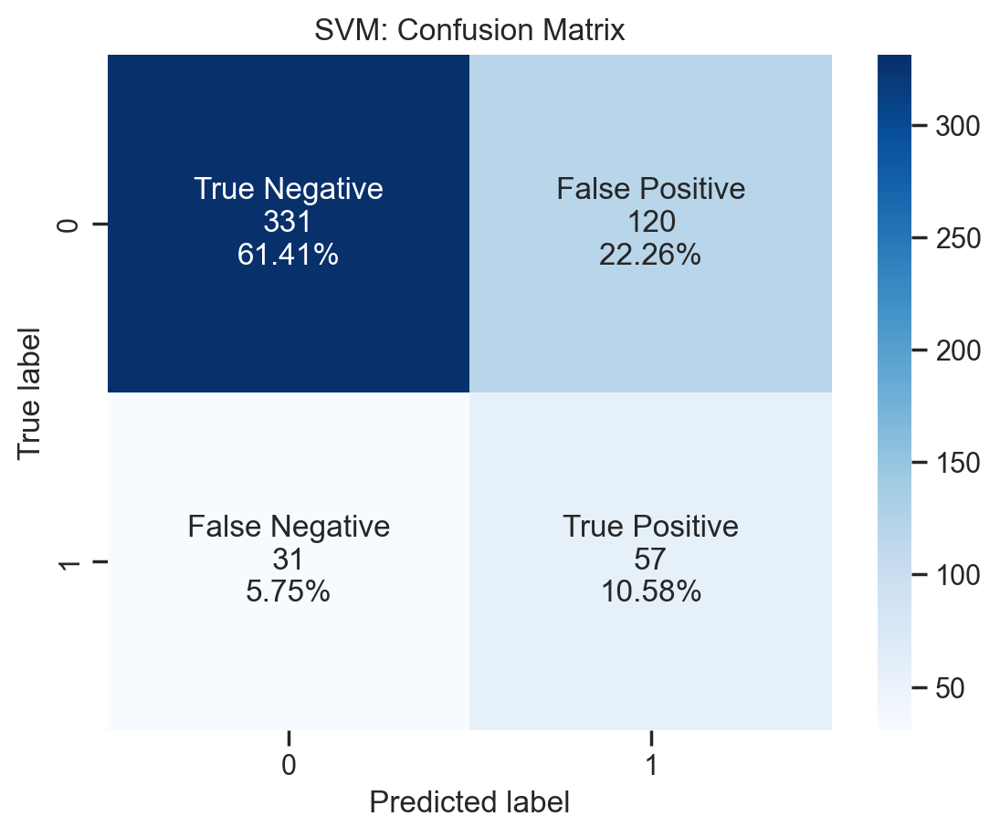

In [162]:
svm_cf_matrix = confusion_matrix(y_test, y_test_predict_svm)
plot_cf_matrix(svm_cf_matrix, model_name="SVM")
plt.show()

No Skill: ROC AUC=0.5
SVM: ROC AUC=0.757


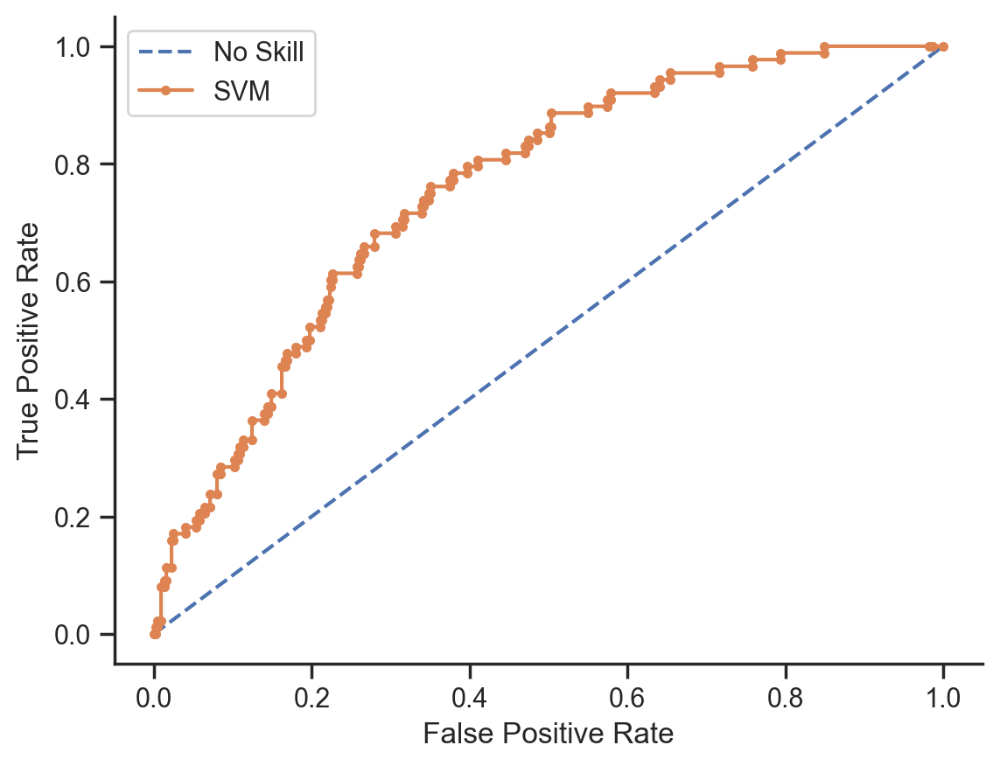

In [163]:
y_test_predict_probs_svm = get_predict_proba(svm_model, X_test_ss)
svm_auc, svm_roc_plot = plot_auc(y_test, y_test_predict_probs_svm, model_name="SVM")

In [164]:
# precision, accuracy, f1-score, and AUC
svm_model_scores = binary_classification_scores(svm_cf_matrix, 
                                                auc=svm_auc, 
                                                model_name='SVM')
svm_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
SVM,0.72,0.322,0.648,0.43,0.757


In [165]:
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_rf = rf_model.predict(X_test_ss)

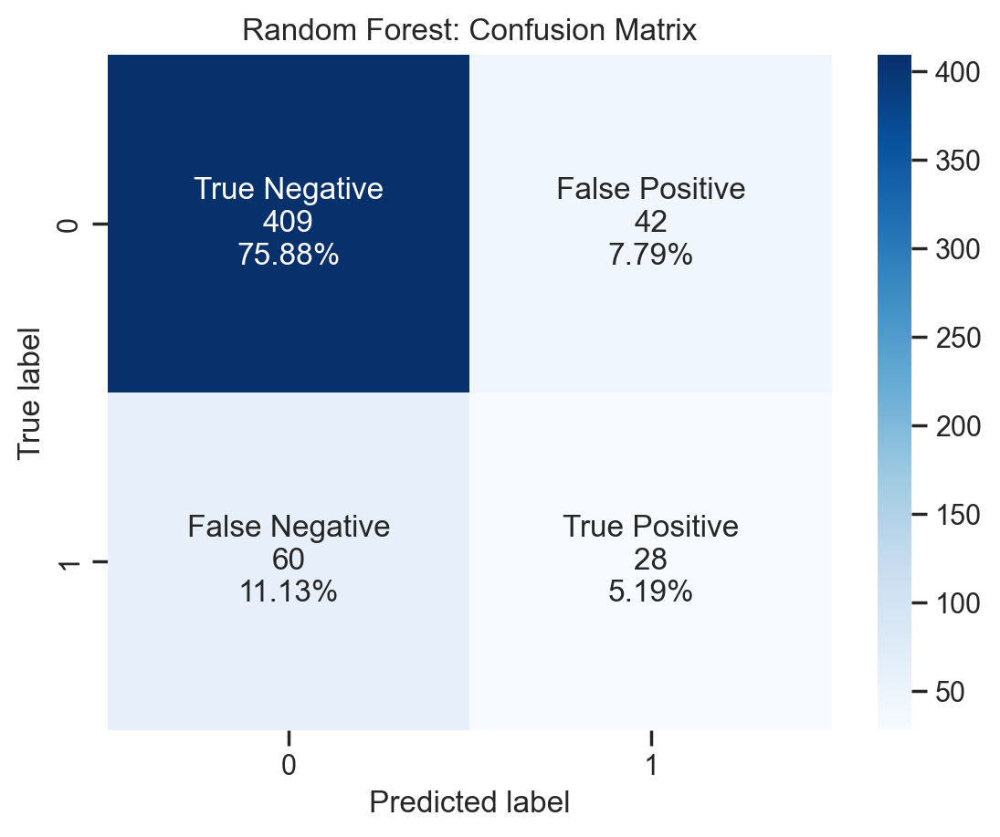

In [166]:
rf_cf_matrix = confusion_matrix(y_test, y_test_predict_rf)
plot_cf_matrix(rf_cf_matrix, model_name="Random Forest")
plt.show()

No Skill: ROC AUC=0.5
Random Forest: ROC AUC=0.789


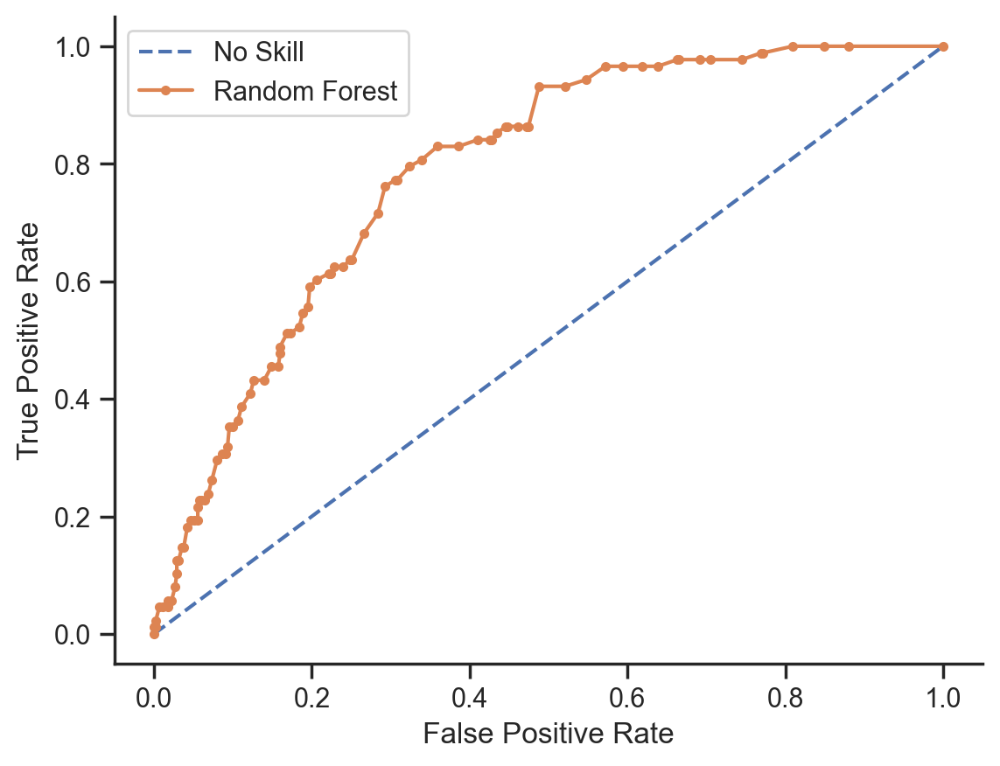

In [167]:
y_test_predict_probs_rf = get_predict_proba(rf_model, X_test_ss)
rf_auc, rf_roc_plot = plot_auc(y_test, y_test_predict_probs_rf, model_name="Random Forest")

In [168]:
# precision, accuracy, f1-score, and AUC
rf_model_scores = binary_classification_scores(rf_cf_matrix,
                                               auc=rf_auc,
                                               model_name='Random Forest')
rf_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
Random Forest,0.811,0.4,0.318,0.354,0.789


In [169]:
# Required Libraries
import lime
from lime.lime_tabular import LimeTabularExplainer

# Initialize LIME explainer
explainer = LimeTabularExplainer(
    training_data=np.array(X_train_oversample),
    feature_names=df_ohe.columns,
    class_names=['No Osteoporosis', 'Osteoporosis'],  # Modify based on your classes
    mode='classification'
)

# Pick a sample to explain
sample_index = 0  # Change index as needed
sample = X_test_ss.iloc[sample_index]

# Explain the sample prediction
exp = explainer.explain_instance(
    data_row=sample,
    predict_fn=lr_model.predict_proba  # Probability prediction function
)

# Visualize the explanation
exp.show_in_notebook(show_table=True)

# Optional: Save explanation to HTML
exp.save_to_file('lime_explanation.html')


In [170]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_knn = knn_model.predict(X_test_ss)

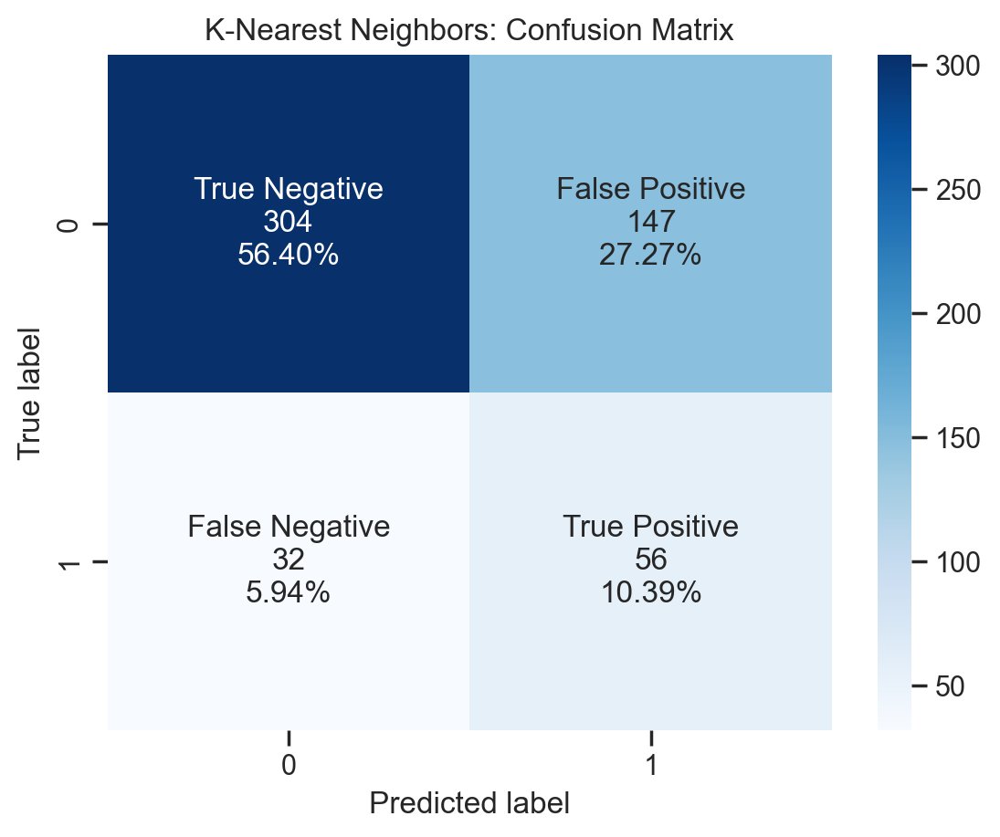

In [171]:
knn_cf_matrix = confusion_matrix(y_test, y_test_predict_knn)
plot_cf_matrix(knn_cf_matrix, model_name="K-Nearest Neighbors")
plt.show()

No Skill: ROC AUC=0.5
K-Nearest Neighbors: ROC AUC=0.709


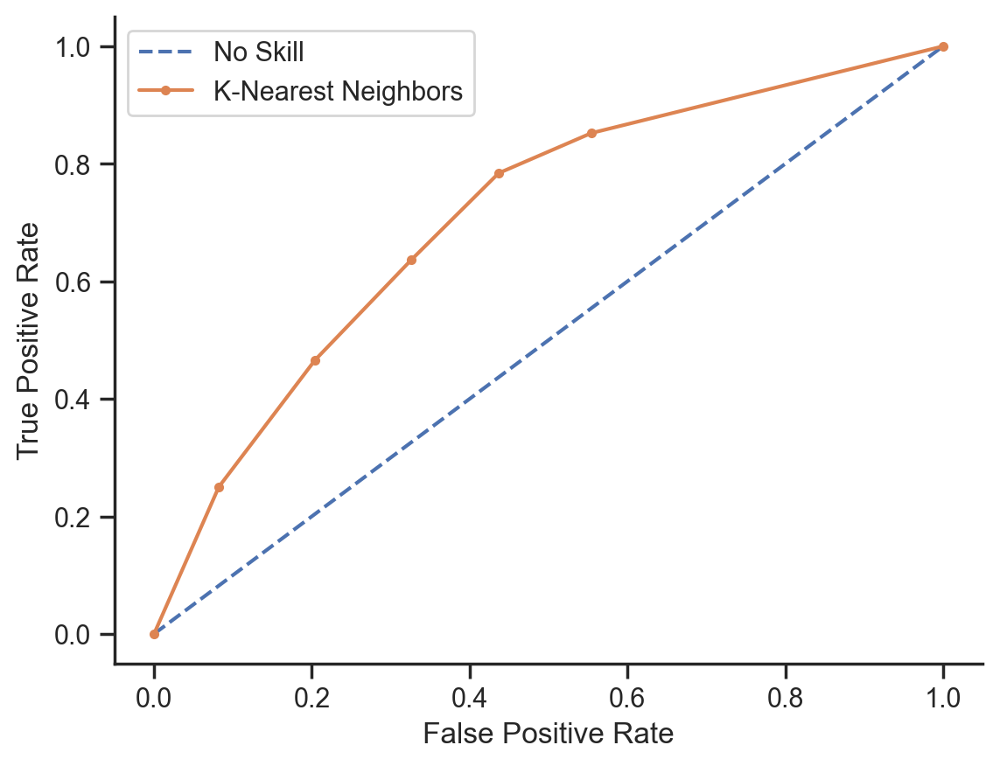

In [172]:
y_test_predict_probs_knn = get_predict_proba(knn_model, X_test_ss)
knn_auc, knn_roc_plot = plot_auc(y_test, y_test_predict_probs_knn, model_name="K-Nearest Neighbors")

In [173]:
knn_model_scores = binary_classification_scores(knn_cf_matrix,
                                                auc=knn_auc,
                                                model_name='K-Nearest Neighbors')
knn_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
K-Nearest Neighbors,0.668,0.276,0.636,0.385,0.709


In [174]:
from sklearn.ensemble import GradientBoostingClassifier

In [175]:
gbm_model = GradientBoostingClassifier(random_state=42)
gbm_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_gbm= gbm_model.predict(X_test_ss)

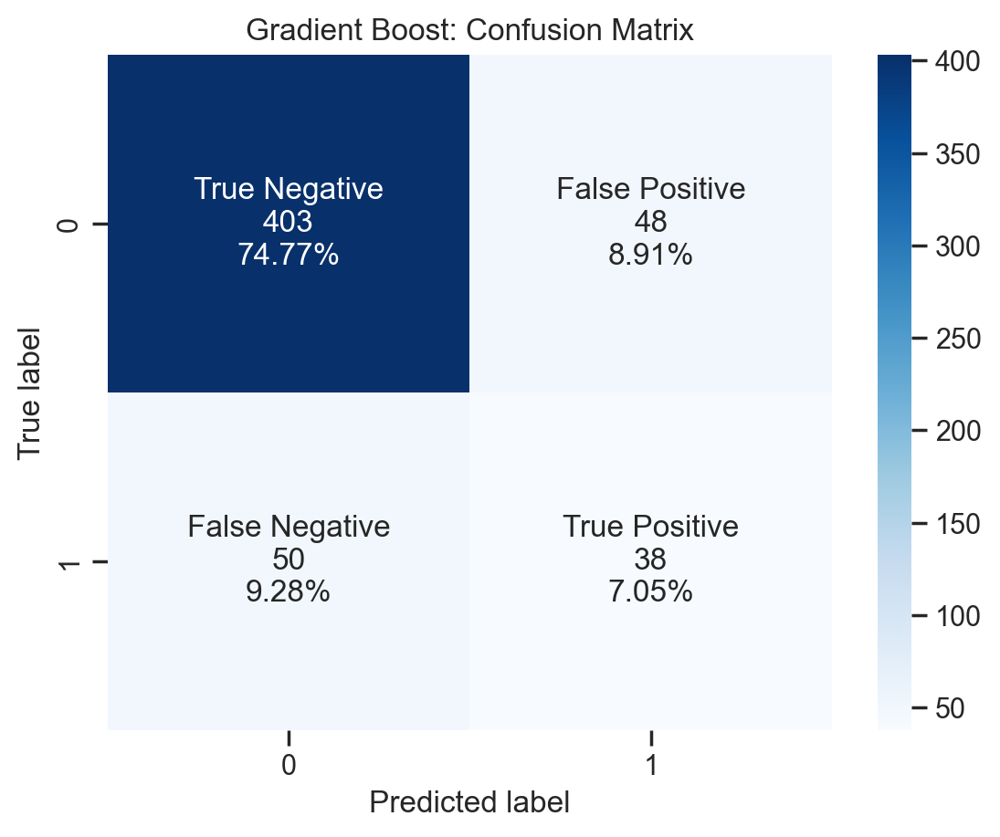

In [176]:
gbm_cf_matrix = confusion_matrix(y_test, y_test_predict_gbm)
plot_cf_matrix(gbm_cf_matrix, model_name="Gradient Boost")
plt.show()

No Skill: ROC AUC=0.5
Gradient Boost: ROC AUC=0.812


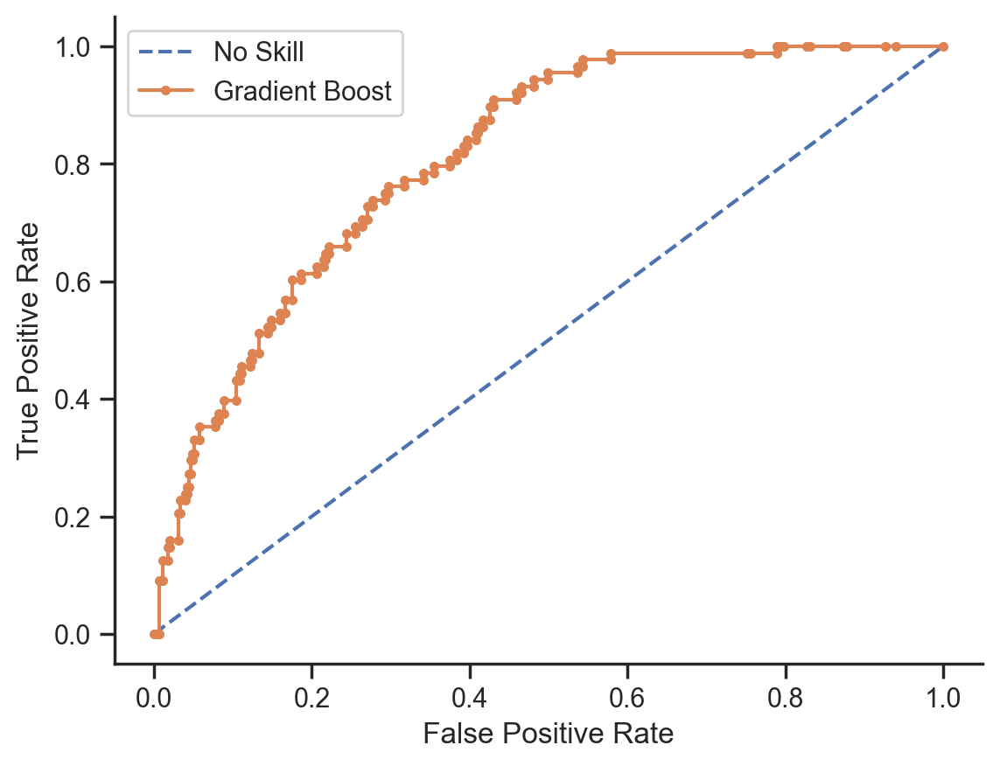

In [177]:
y_test_predict_probs_gbm = get_predict_proba(gbm_model, X_test_ss)
gbm_auc, gbm_roc_plot = plot_auc(y_test, y_test_predict_probs_gbm, model_name="Gradient Boost")

In [178]:
# precision, accuracy, f1-score, and AUC
gbm_model_scores = binary_classification_scores(gbm_cf_matrix,
                                               auc=gbm_auc,
                                               model_name='Gradient Boost')
gbm_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
Gradient Boost,0.818,0.442,0.432,0.437,0.812


In [179]:
from sklearn.tree import DecisionTreeClassifier

In [180]:
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_dt= dt_model.predict(X_test_ss)


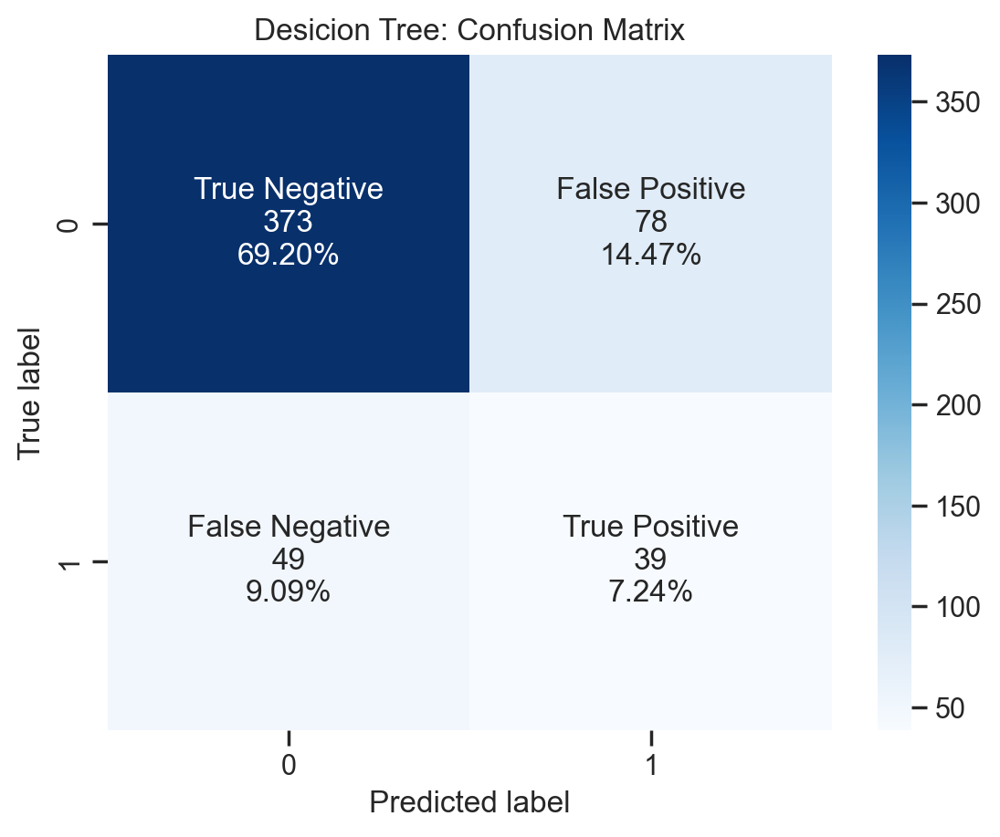

In [181]:
dt_cf_matrix = confusion_matrix(y_test, y_test_predict_dt)
plot_cf_matrix(dt_cf_matrix, model_name="Desicion Tree")
plt.show()

No Skill: ROC AUC=0.5
Descion Tree: ROC AUC=0.634


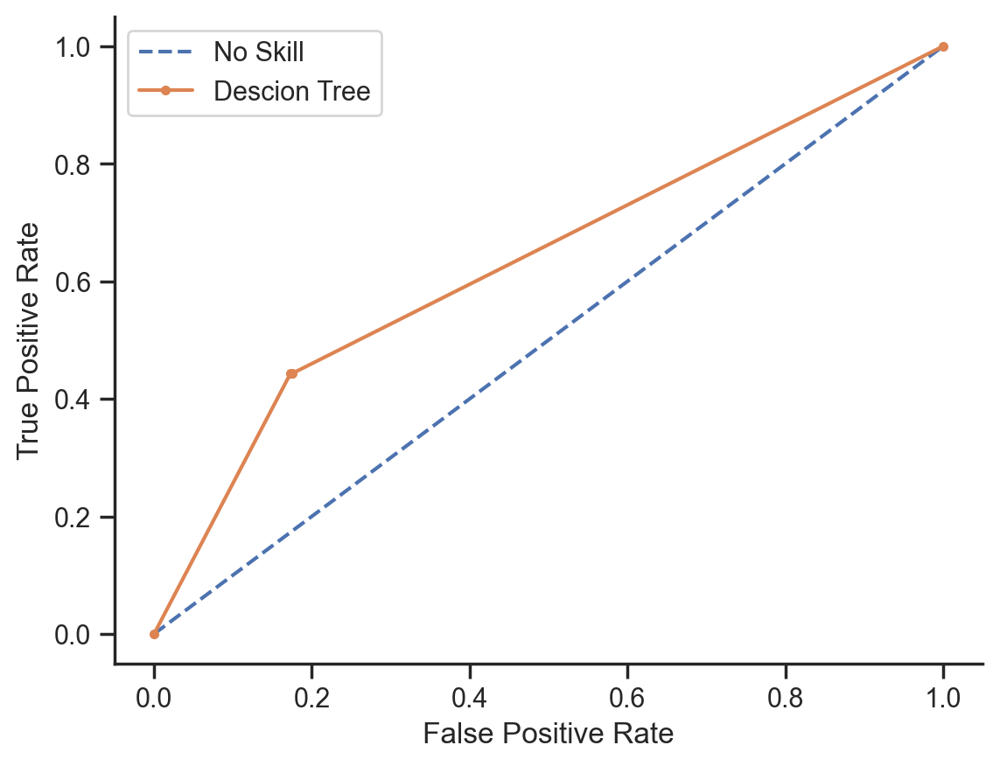

In [182]:
y_test_predict_probs_dt = get_predict_proba(dt_model, X_test_ss)
dt_auc, dt_roc_plot = plot_auc(y_test, y_test_predict_probs_dt, model_name="Descion Tree")

In [183]:
dt_model_scores = binary_classification_scores(dt_cf_matrix,
                                               auc=dt_auc,
                                               model_name='Decision Tree')
dt_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
Decision Tree,0.764,0.333,0.443,0.38,0.634


In [184]:
from sklearn.ensemble import AdaBoostClassifier

In [185]:
adaboost_model = AdaBoostClassifier(random_state=42)
adaboost_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_adaboost= adaboost_model.predict(X_test_ss)

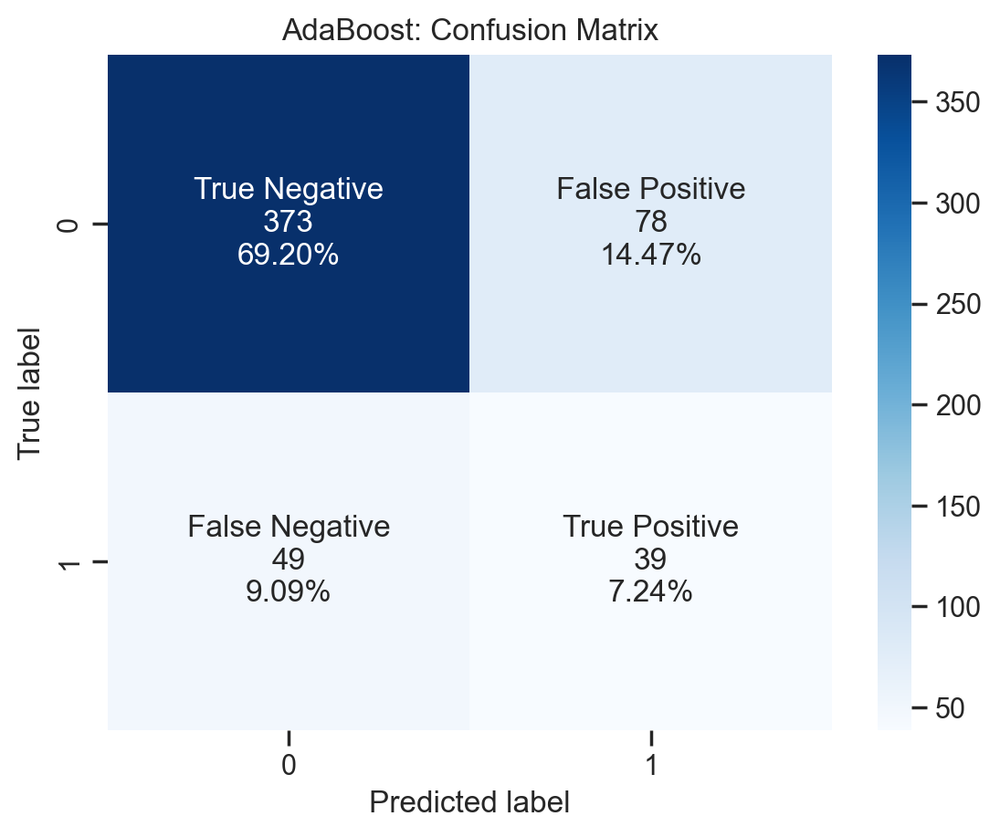

In [186]:
adaboost_cf_matrix = confusion_matrix(y_test, y_test_predict_dt)
plot_cf_matrix(adaboost_cf_matrix, model_name="AdaBoost")
plt.show()

No Skill: ROC AUC=0.5
AdaBoost: ROC AUC=0.778


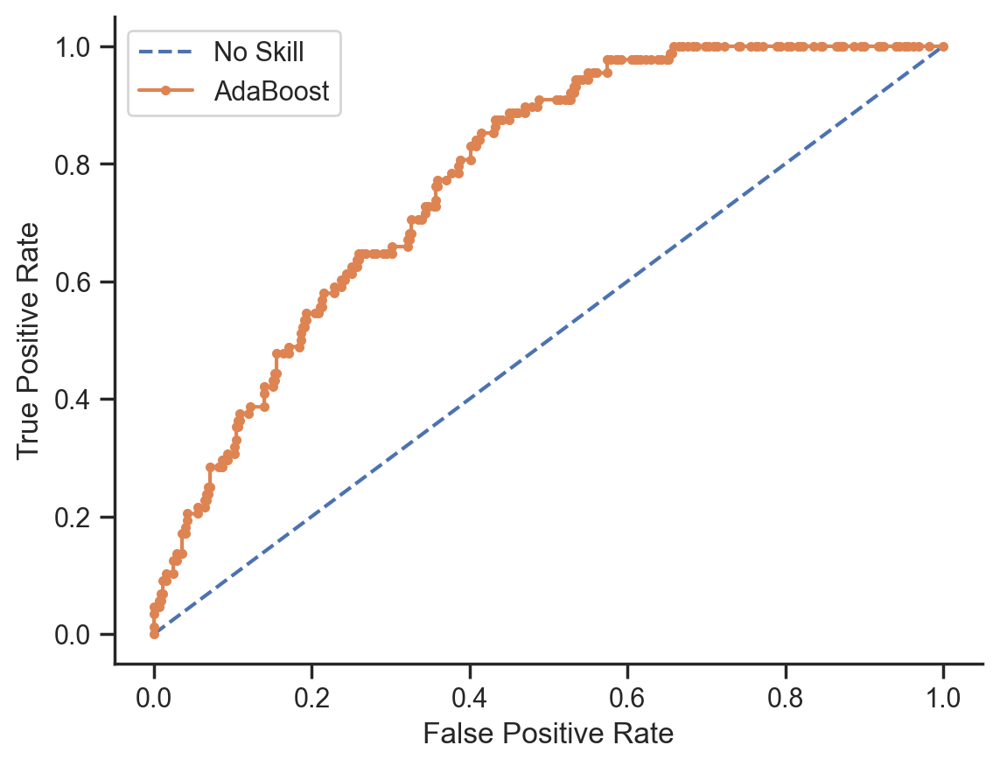

In [187]:
y_test_predict_probs_adaboost = get_predict_proba(adaboost_model, X_test_ss)
adaboost_auc, adaboost_roc_plot = plot_auc(y_test, y_test_predict_probs_adaboost, model_name="AdaBoost")

In [188]:
adaboost_model_scores = binary_classification_scores(adaboost_cf_matrix,
                                               auc=adaboost_auc,
                                               model_name="AdaBoost")
adaboost_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
AdaBoost,0.764,0.333,0.443,0.38,0.778


In [189]:
from catboost import CatBoostClassifier

In [190]:
catboost_model = CatBoostClassifier(verbose=0)
catboost_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_catboost = catboost_model.predict(X_test_ss)

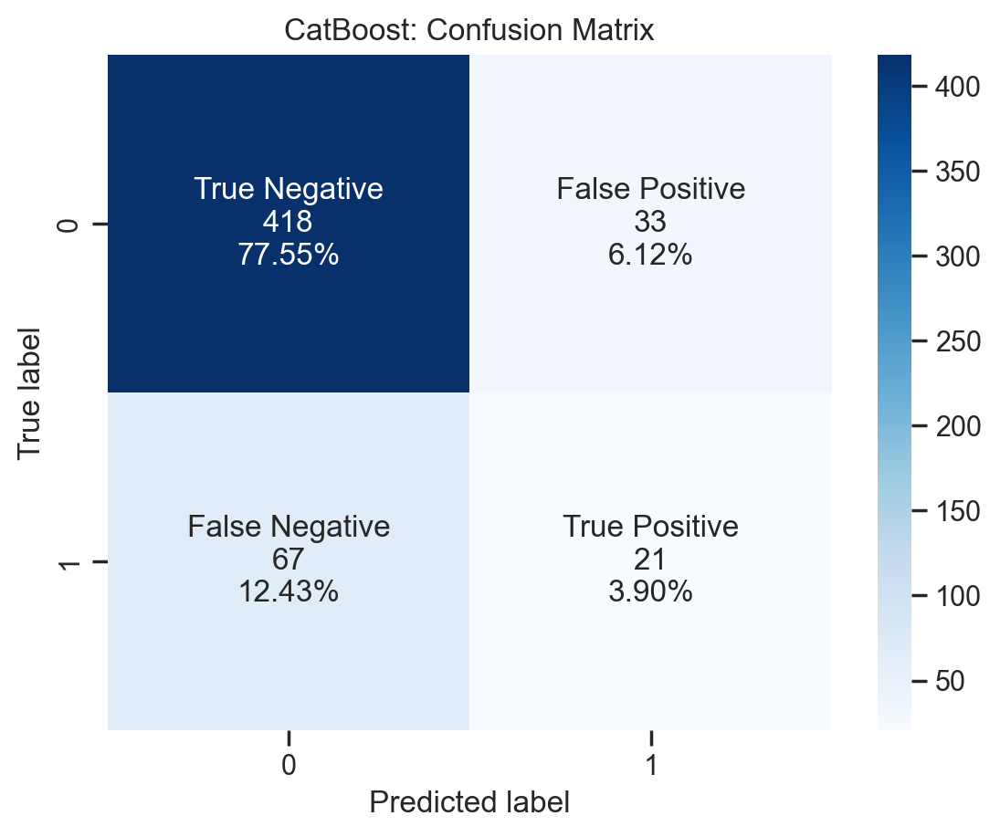

In [191]:
catboost_cf_matrix = confusion_matrix(y_test, y_test_predict_catboost)
plot_cf_matrix(catboost_cf_matrix, model_name="CatBoost")
plt.show()

No Skill: ROC AUC=0.5
CatBoost: ROC AUC=0.776


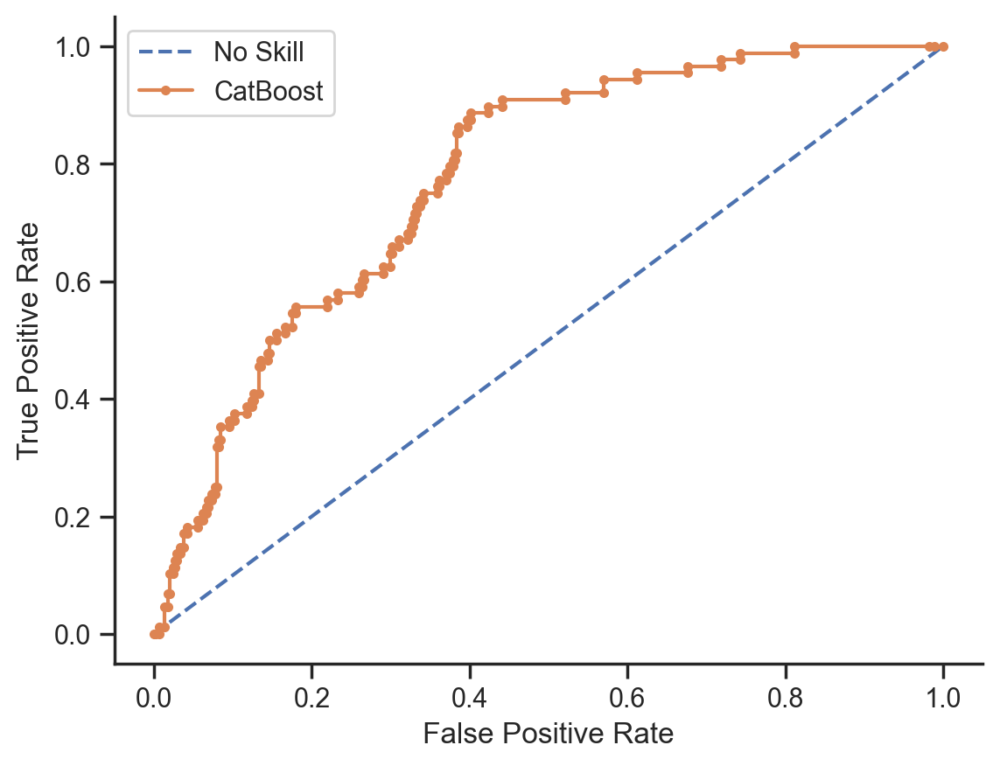

In [192]:
y_test_predict_probs_catboost = get_predict_proba(catboost_model, X_test_ss)
catboost_auc, catboost_roc_plot = plot_auc(y_test, y_test_predict_probs_catboost, model_name="CatBoost")

In [193]:
catboost_model_scores = binary_classification_scores(catboost_cf_matrix, auc=catboost_auc, model_name='CatBoost')
catboost_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
CatBoost,0.814,0.389,0.239,0.296,0.776


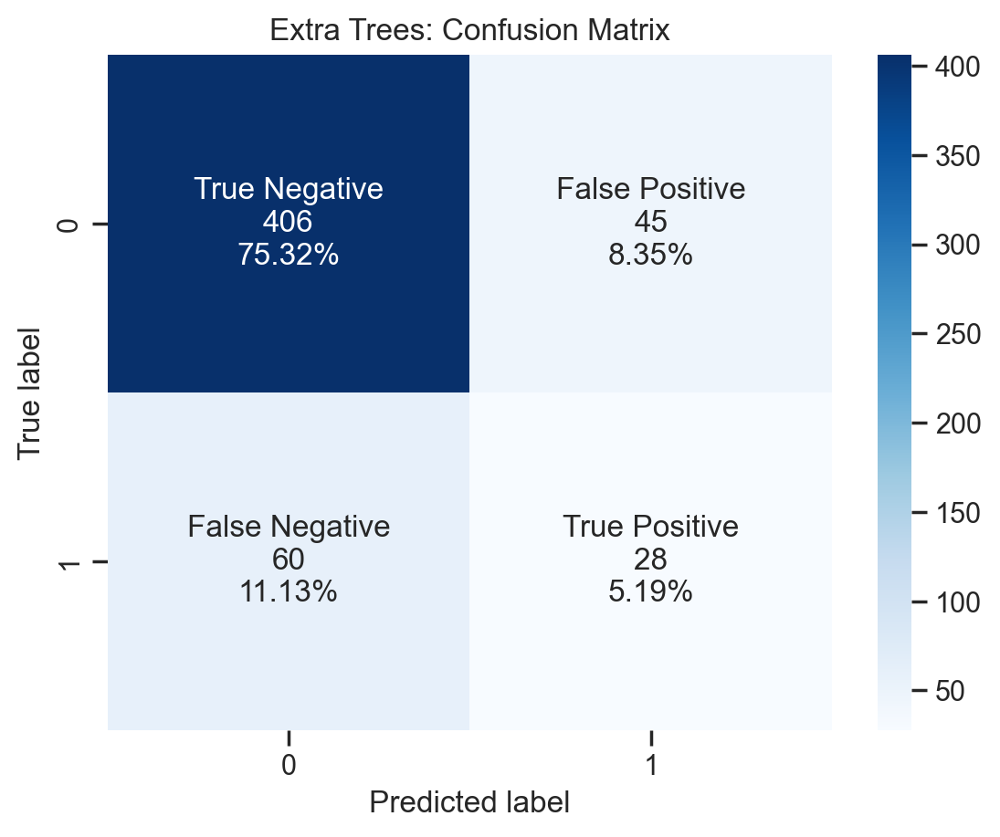

No Skill: ROC AUC=0.5
Extra Trees: ROC AUC=0.753


,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
Extra Trees,0.805,0.384,0.318,0.348,0.753


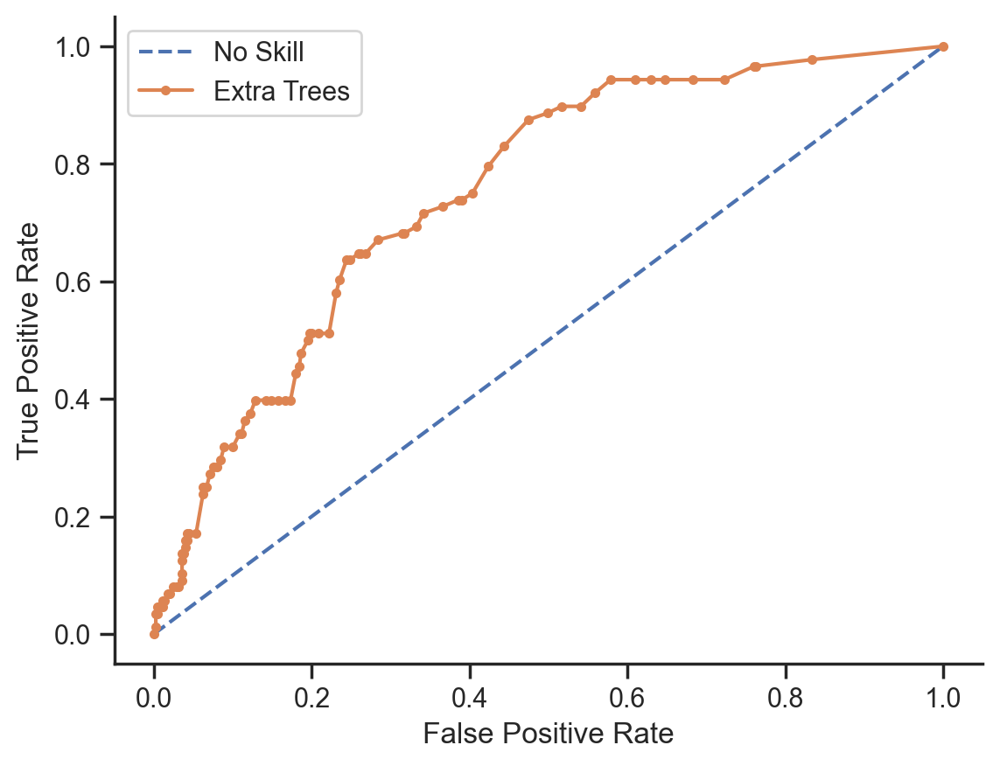

In [194]:
from sklearn.ensemble import ExtraTreesClassifier

# Define and fit Extra Trees model
extra_trees_model = ExtraTreesClassifier()
extra_trees_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_extra_trees = extra_trees_model.predict(X_test_ss)

# Confusion matrix and AUC for Extra Trees
extra_trees_cf_matrix = confusion_matrix(y_test, y_test_predict_extra_trees)
plot_cf_matrix(extra_trees_cf_matrix, model_name="Extra Trees")
plt.show()

y_test_predict_probs_extra_trees = get_predict_proba(extra_trees_model, X_test_ss)
extra_trees_auc, extra_trees_roc_plot = plot_auc(y_test, y_test_predict_probs_extra_trees, model_name="Extra Trees")

# Extra Trees model scores
extra_trees_model_scores = binary_classification_scores(extra_trees_cf_matrix, auc=extra_trees_auc, model_name='Extra Trees')
extra_trees_model_scores

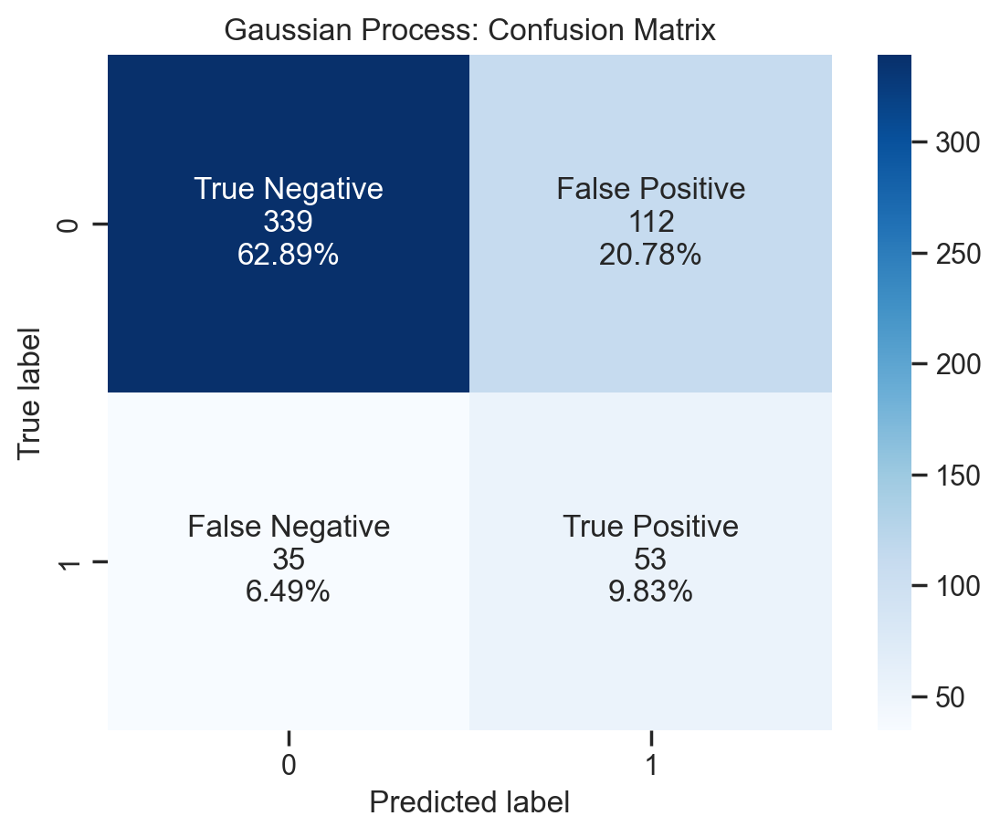

No Skill: ROC AUC=0.5
Gaussian Process: ROC AUC=0.754


,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
Gaussian Process,0.727,0.321,0.602,0.419,0.754


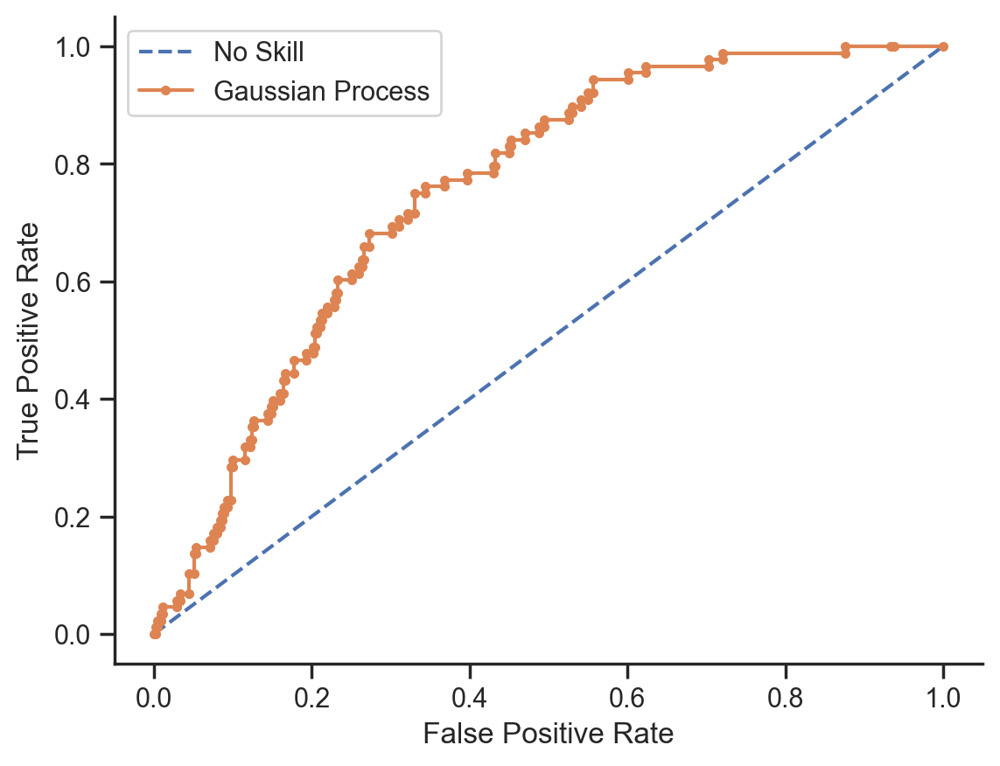

In [195]:
from sklearn.gaussian_process import GaussianProcessClassifier

# Define and fit Gaussian Process model
gaussian_process_model = GaussianProcessClassifier()
gaussian_process_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_gaussian_process = gaussian_process_model.predict(X_test_ss)

# Confusion matrix and AUC for Gaussian Process
gaussian_process_cf_matrix = confusion_matrix(y_test, y_test_predict_gaussian_process)
plot_cf_matrix(gaussian_process_cf_matrix, model_name="Gaussian Process")
plt.show()

y_test_predict_probs_gaussian_process = get_predict_proba(gaussian_process_model, X_test_ss)
gaussian_process_auc, gaussian_process_roc_plot = plot_auc(y_test, y_test_predict_probs_gaussian_process, model_name="Gaussian Process")

# Gaussian Process model scores
gaussian_process_model_scores = binary_classification_scores(gaussian_process_cf_matrix, auc=gaussian_process_auc, model_name='Gaussian Process')
gaussian_process_model_scores

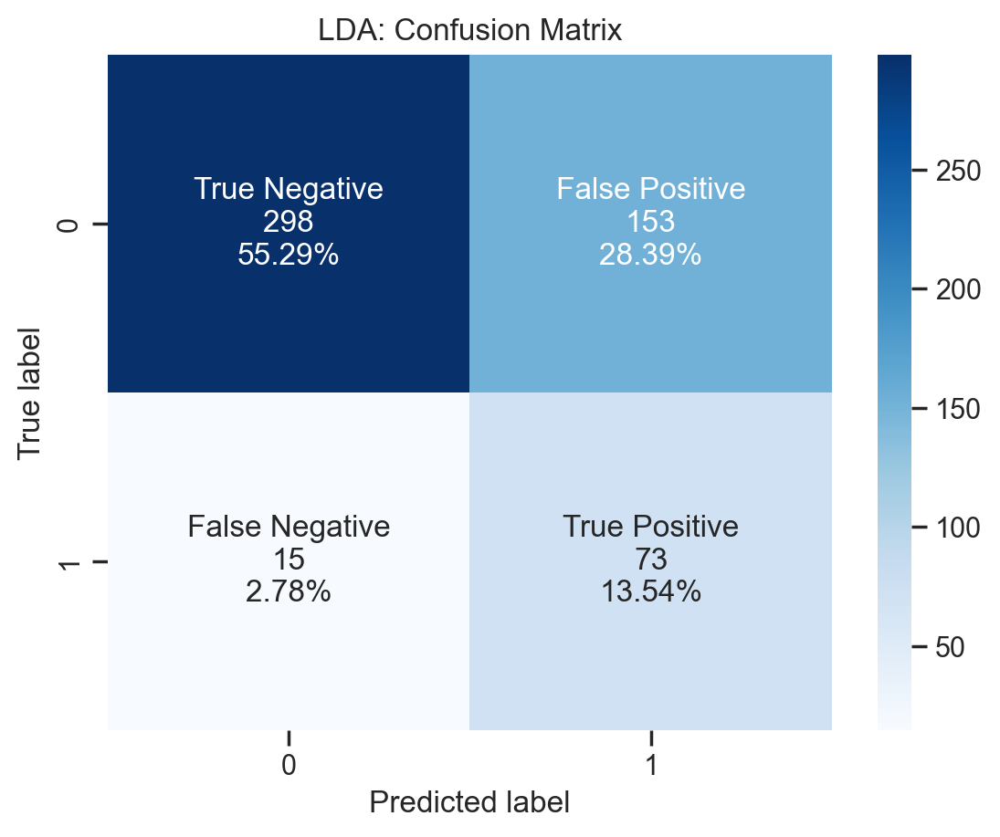

No Skill: ROC AUC=0.5
LDA: ROC AUC=0.829


,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
LDA,0.688,0.323,0.83,0.465,0.829


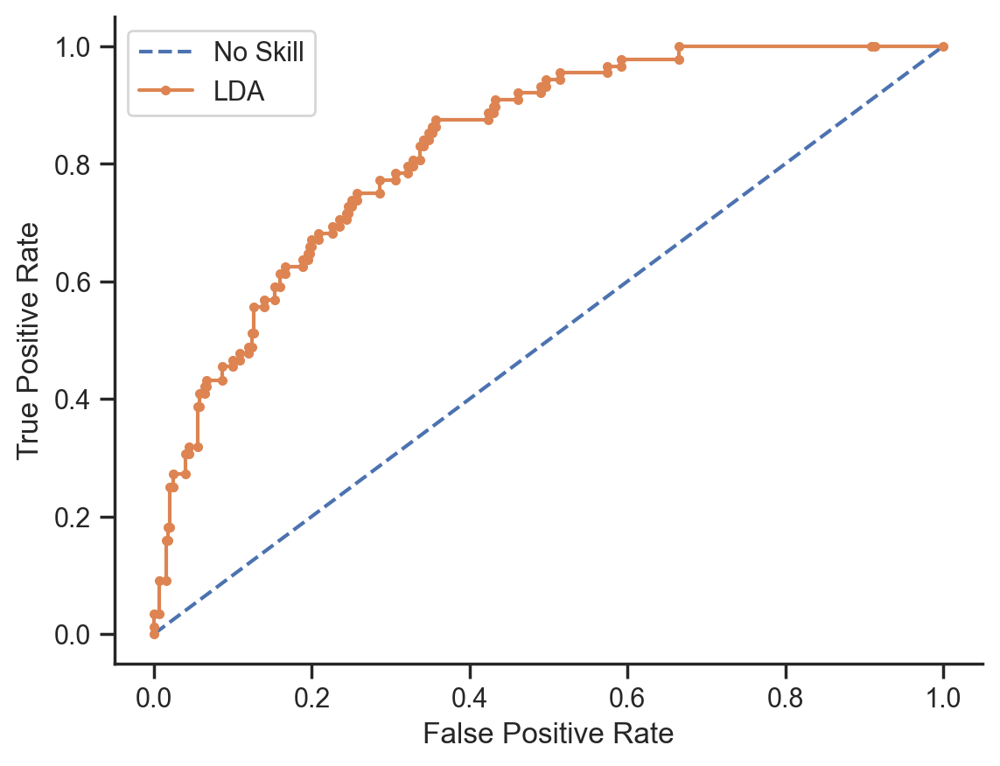

In [196]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Define and fit Linear Discriminant Analysis model
lda_model = LinearDiscriminantAnalysis()
lda_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_lda = lda_model.predict(X_test_ss)

# Confusion matrix and AUC for LDA
lda_cf_matrix = confusion_matrix(y_test, y_test_predict_lda)
plot_cf_matrix(lda_cf_matrix, model_name="LDA")
plt.show()

y_test_predict_probs_lda = get_predict_proba(lda_model, X_test_ss)
lda_auc, lda_roc_plot = plot_auc(y_test, y_test_predict_probs_lda, model_name="LDA")

# LDA model scores
lda_model_scores = binary_classification_scores(lda_cf_matrix, auc=lda_auc, model_name='LDA')
lda_model_scores


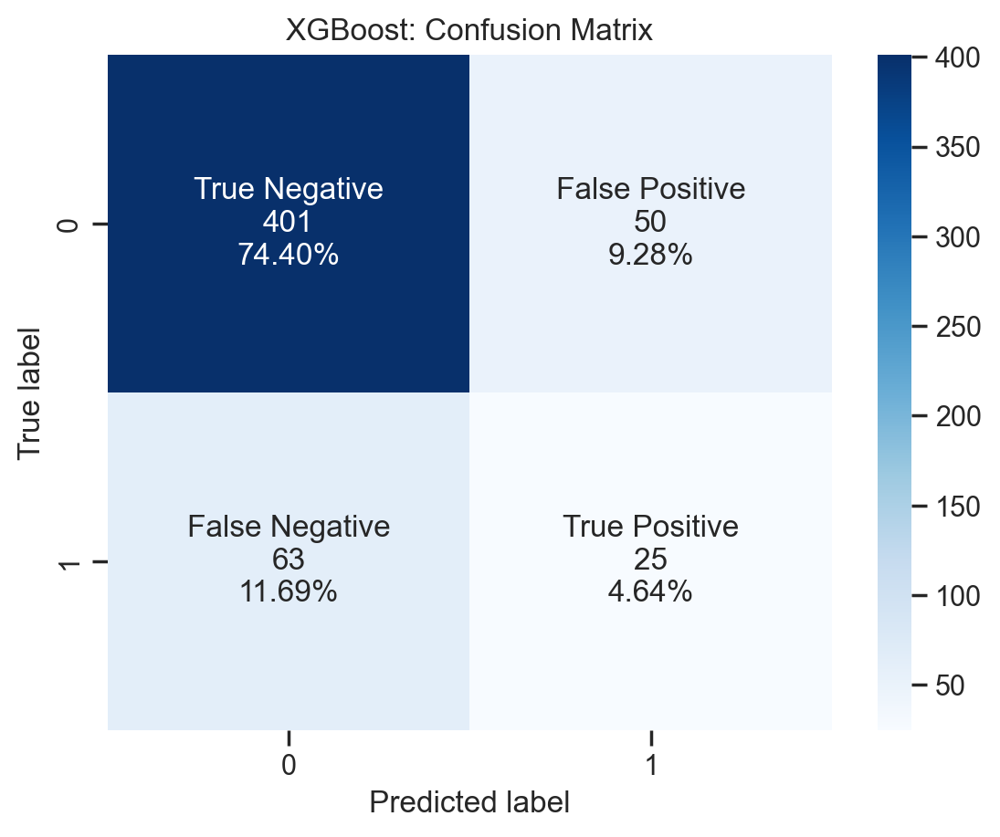

No Skill: ROC AUC=0.5
XGBoost: ROC AUC=0.729


,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
XGBoost,0.79,0.333,0.284,0.307,0.729


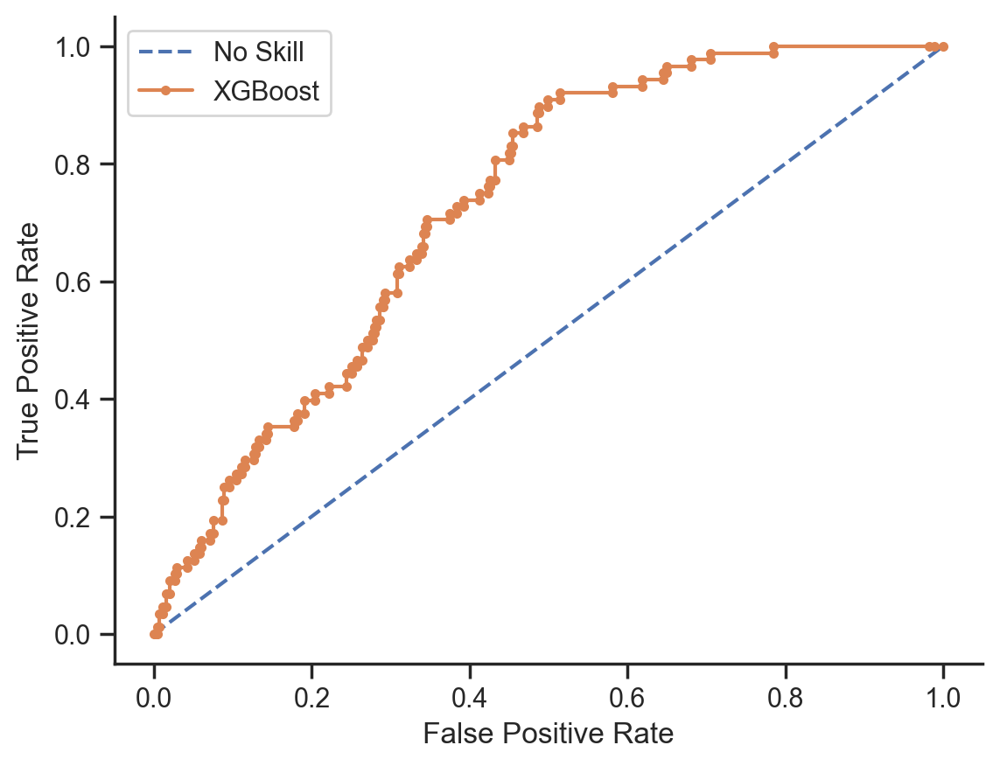

In [197]:
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Define and fit XGBoost model
xgboost_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgboost_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_xgboost = xgboost_model.predict(X_test_ss)

# Confusion matrix and AUC for XGBoost
xgboost_cf_matrix = confusion_matrix(y_test, y_test_predict_xgboost)
plot_cf_matrix(xgboost_cf_matrix, model_name="XGBoost")
plt.show()

y_test_predict_probs_xgboost = get_predict_proba(xgboost_model, X_test_ss)
xgboost_auc, xgboost_roc_plot = plot_auc(y_test, y_test_predict_probs_xgboost, model_name="XGBoost")

# XGBoost model scores
xgboost_model_scores = binary_classification_scores(xgboost_cf_matrix, auc=xgboost_auc, model_name='XGBoost')
xgboost_model_scores

In [198]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import shap
from lime.lime_tabular import LimeTabularExplainer

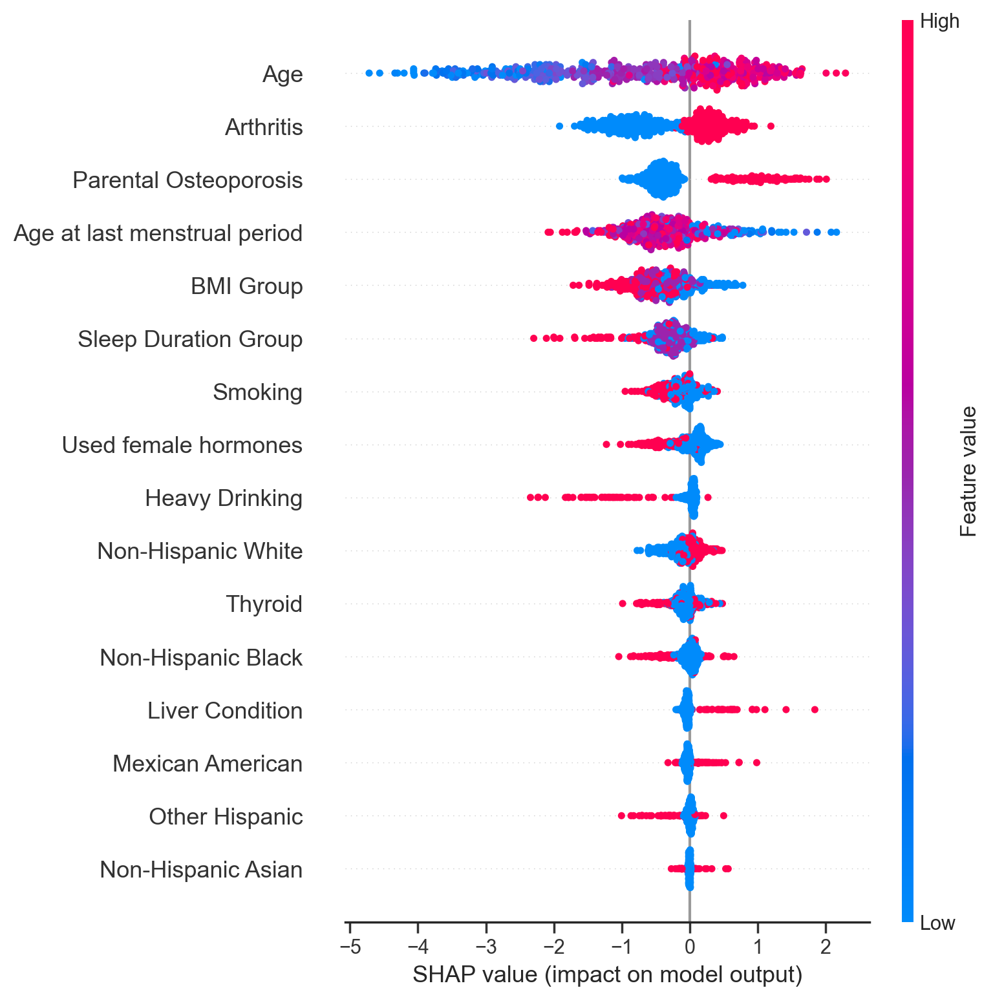

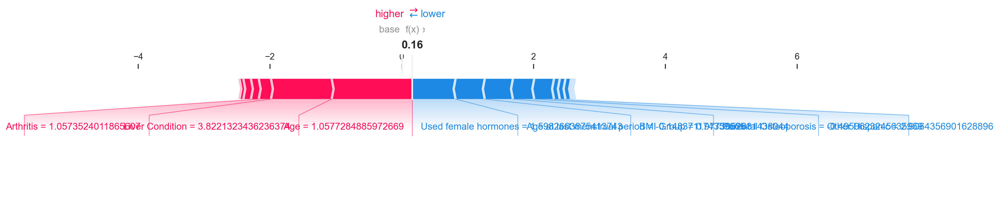

In [199]:
explainer = shap.TreeExplainer(xgboost_model)
# Get SHAP values for the test set
shap_values = explainer.shap_values(X_test_ss)

# Plot summary of SHAP values
shap.summary_plot(shap_values, X_test_ss)

# Plot individual SHAP explanations for one sample
shap.force_plot(explainer.expected_value, shap_values[0, :], X_test_ss.iloc[0, :], matplotlib=True)

# -------- LIME Explanation --------
# Initialize LIME explainer
lime_explainer = LimeTabularExplainer(
    X_train_oversample.values,
    feature_names=X_train_oversample.columns,
    class_names=[str(c) for c in np.unique(y_train_oversample)],
    mode='classification'
)

# Choose an instance to explain
instance_idx = 0
instance = X_test_ss.iloc[instance_idx].values

# Get LIME explanation
lime_exp = lime_explainer.explain_instance(instance, xgboost_model.predict_proba, num_features=5)
lime_exp.show_in_notebook()

# To save LIME plot as an HTML file
lime_exp.save_to_file('data/lime_explanation.html')

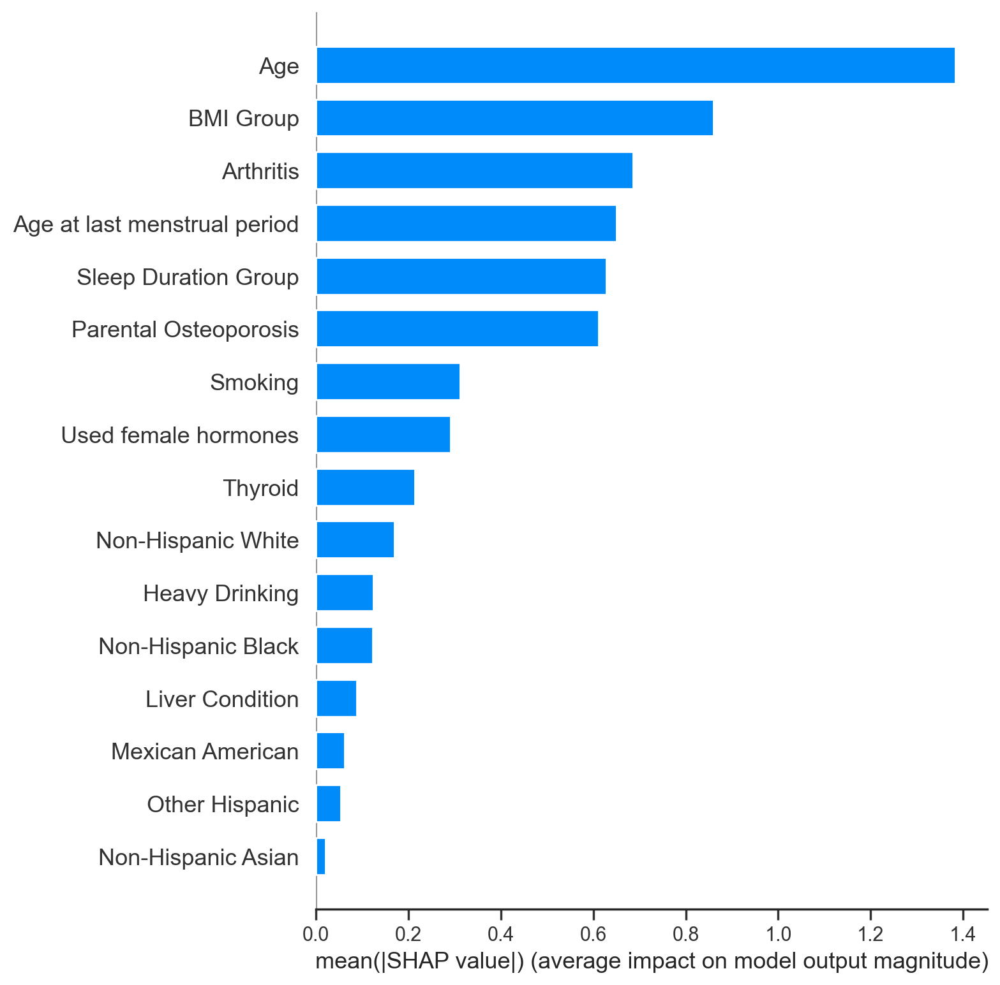

In [200]:
shap_explainer = shap.TreeExplainer(xgboost_model)
shap_values = shap_explainer.shap_values(X_train_oversample)

shap.summary_plot(shap_values=shap_values, features=X_test_ss, feature_names=features.columns, plot_type='bar')
# print(value)

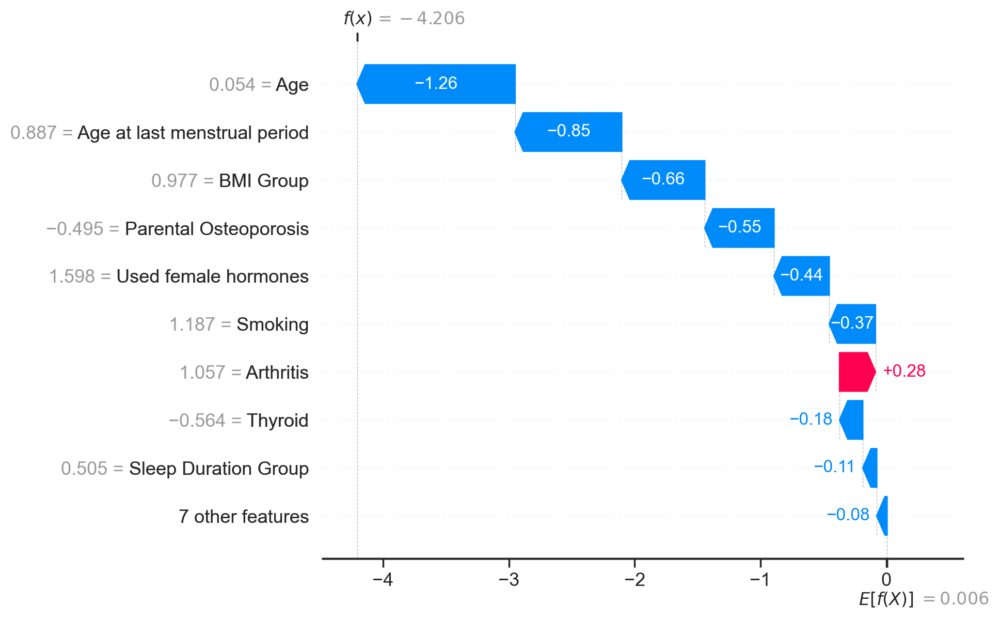

In [201]:
import matplotlib.pyplot as plt

# Select a sample to explain
sample_index = 0
sample_shap_values = shap_values[sample_index]  # Get the SHAP values for the selected sample
base_value = explainer.expected_value  # Obtain the base value (expected value)

# Create the explanation object
explanation = shap.Explanation(values=sample_shap_values, 
                               base_values=base_value, 
                               data=X_train_oversample.iloc[sample_index, :], 
                               feature_names=X_train_oversample.columns.tolist())

# Create the waterfall plot
shap.plots.waterfall(explanation, max_display=10, show=True)

# Display the plot
plt.show()

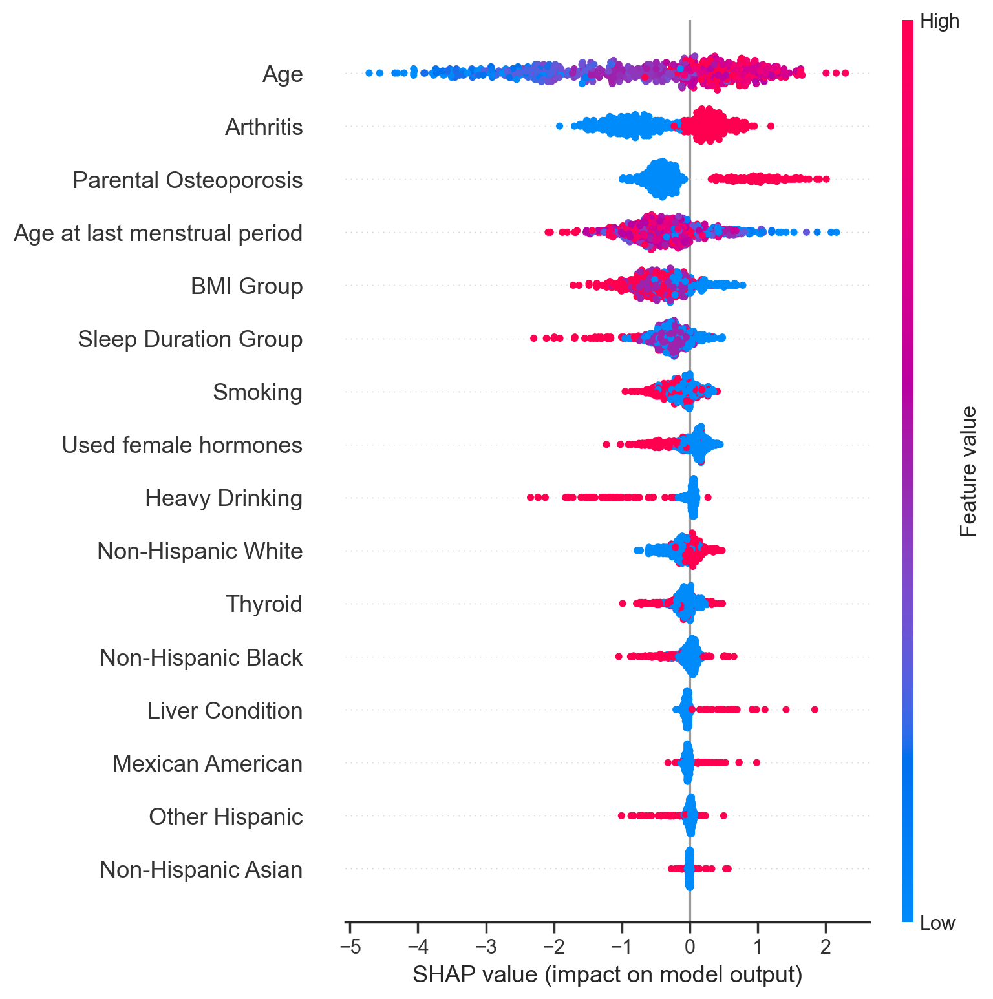

In [202]:
explainer = shap.Explainer(xgboost_model)
shap_values = explainer(X_test_ss)  # Use explainer directly to get an Explanation object

# Plot summary for binary or single-class model
shap.summary_plot(shap_values.values, X_test_ss)

# If it's a multi-class model, plot each class separately
if isinstance(shap_values.values, list):
    for i in range(len(shap_values.values)):
        print(f"Summary plot for class {i}")
        shap.summary_plot(shap_values.values[i], X_test_ss)

In [203]:
from sklearn.naive_bayes import GaussianNB

In [204]:
nb_model = GaussianNB()
nb_model.fit(X_train_oversample, y_train_oversample)
y_test_predict_nb= nb_model.predict(X_test_ss)

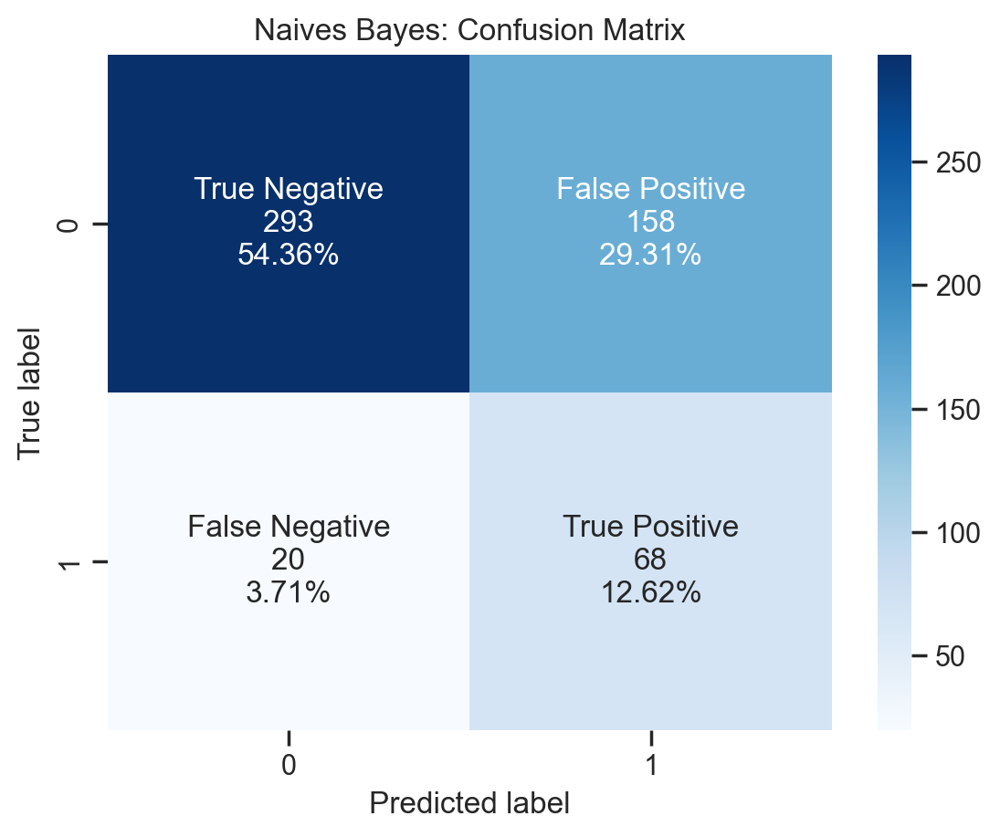

In [205]:
nb_cf_matrix = confusion_matrix(y_test, y_test_predict_nb)
plot_cf_matrix(nb_cf_matrix, model_name="Naives Bayes")
plt.show()

No Skill: ROC AUC=0.5
Naive Bayes: ROC AUC=0.78


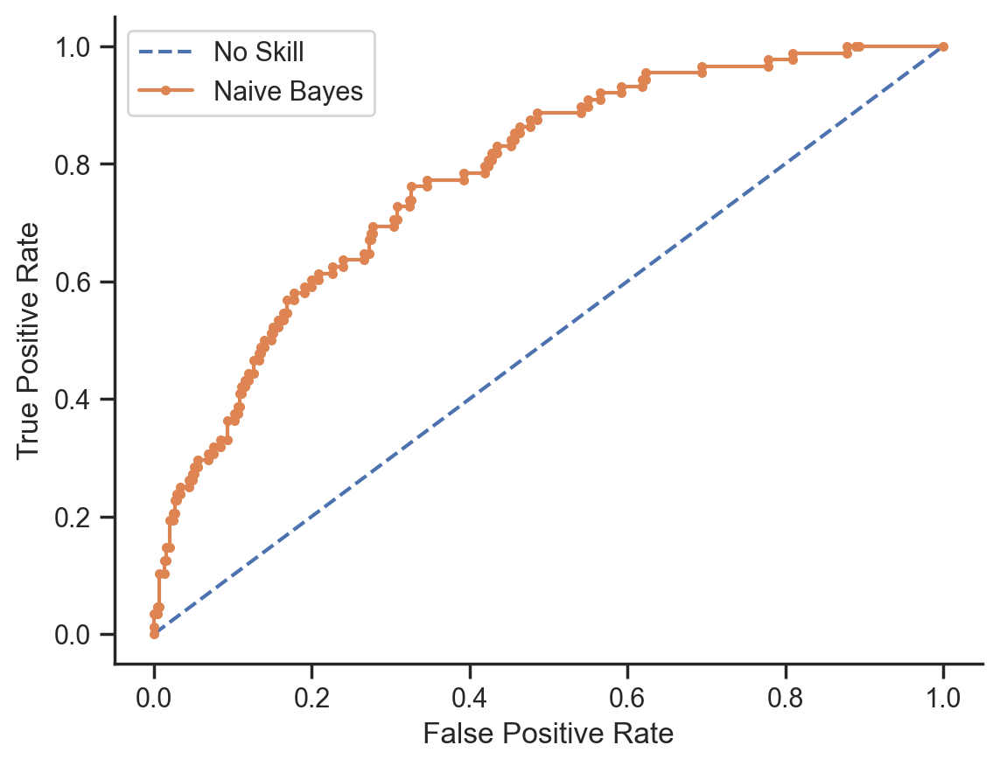

In [206]:
y_test_predict_probs_nb = get_predict_proba(nb_model, X_test_ss)
nb_auc, nb_roc_plot = plot_auc(y_test, y_test_predict_probs_nb, model_name="Naive Bayes")

In [207]:
nb_model_scores = binary_classification_scores(nb_cf_matrix,
                                               auc=nb_auc,
                                               model_name='Naive Bayes')
nb_model_scores

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
Naive Bayes,0.67,0.301,0.773,0.433,0.78


No Skill: ROC AUC=0.5
Logistic Regression: ROC AUC=0.828
SVM: ROC AUC=0.757
Random Forest: ROC AUC=0.789
Gradient Boost: ROC AUC=0.812
Decision Tree: ROC AUC=0.634
Naive Bayes: ROC AUC=0.78
KNN: ROC AUC=0.709
Ada Boost: ROC AUC=0.778
CatBoost: ROC AUC=0.776
XGBoost: ROC AUC=0.729
Extra Trees: ROC AUC=0.753
Gaussian Process: ROC AUC=0.754
Linear Discriminant Analysis (LDA) Model: ROC AUC=0.829


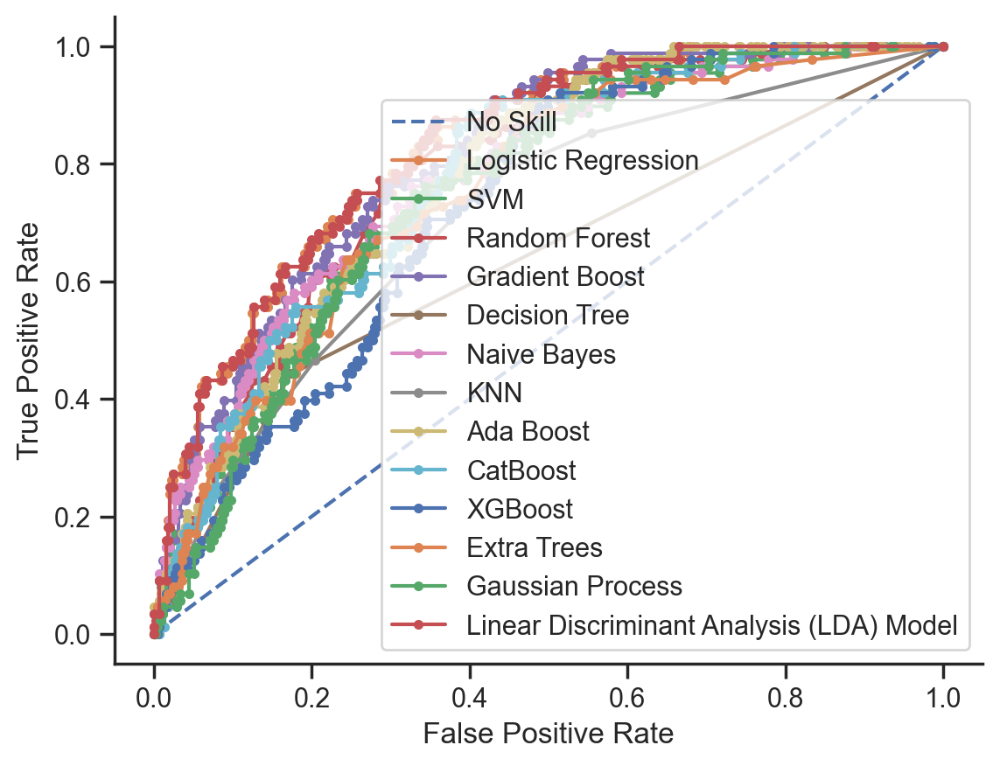

In [208]:
plot_auc(y_test, 
    y_test_predict_probs_lr, 
    model_name="Logistic Regression")
plot_auc(y_test, 
    y_test_predict_probs_svm, 
    display_no_skill=False,
    model_name="SVM")
plot_auc(y_test, 
    y_test_predict_probs_rf, 
    display_no_skill=False,
    model_name="Random Forest")
plot_auc(y_test, 
    y_test_predict_probs_gbm, 
    display_no_skill=False,
    model_name="Gradient Boost")
plot_auc(y_test, 
    y_test_predict_probs_dt, 
    display_no_skill=False,
    model_name="Decision Tree")
plot_auc(y_test, 
    y_test_predict_probs_nb, 
    display_no_skill=False,
    model_name="Naive Bayes")
plot_auc(y_test, 
    y_test_predict_probs_knn, 
    display_no_skill=False,
    model_name="KNN")
plot_auc(y_test, 
    y_test_predict_probs_adaboost, 
    display_no_skill=False,
    model_name="Ada Boost")
plot_auc(y_test, 
    y_test_predict_probs_catboost, 
    display_no_skill=False,
    model_name="CatBoost")
plot_auc(y_test, 
    y_test_predict_probs_xgboost, 
    display_no_skill=False,
    model_name="XGBoost")
plot_auc(y_test, 
    y_test_predict_probs_extra_trees, 
    display_no_skill=False,
    model_name="Extra Trees")
plot_auc(y_test, 
    y_test_predict_probs_gaussian_process, 
    display_no_skill=False,
    model_name="Gaussian Process")
plot_auc(y_test, 
    y_test_predict_probs_lda, 
    display_no_skill=False,
    model_name="Linear Discriminant Analysis (LDA) Model")
plt.show()

In [209]:
lr_scores = lr_model_scores.rename(index={2:'Logistic Regression'})
combined = pd.concat([lr_scores, svm_model_scores,dt_model_scores, gbm_model_scores, nb_model_scores, rf_model_scores, knn_model_scores, adaboost_model_scores,catboost_model_scores, xgboost_model_scores, lda_model_scores, extra_trees_model_scores, gaussian_process_model_scores])
combined.sort_values(by=['F1 Score'], ascending=False)

,Accuracy,Precision,Recall,F1 Score,AUC
Model,,,,,
Logistic Regression,0.692,0.324,0.818,0.465,0.828
LDA,0.688,0.323,0.830,0.465,0.829
Gradient Boost,0.818,0.442,0.432,0.437,0.812
Naive Bayes,0.670,0.301,0.773,0.433,0.780
SVM,0.720,0.322,0.648,0.430,0.757
Gaussian Process,0.727,0.321,0.602,0.419,0.754
K-Nearest Neighbors,0.668,0.276,0.636,0.385,0.709
Decision Tree,0.764,0.333,0.443,0.380,0.634
AdaBoost,0.764,0.333,0.443,0.380,0.778


In [212]:
from scipy.stats import chi2_contingency, ttest_ind

In [213]:
def hypothesis_test_categorical(X, Y):
    """Perform Chi-Square test for categorical variables."""
    for col in X.select_dtypes(include=['object']).columns:
        contingency_table = pd.crosstab(X[col], Y)
        chi2, p, _, _ = chi2_contingency(contingency_table)
        print(f"Chi-Square Test for {col}: p-value = {p}")
        if p < 0.05:
            print(f"The relationship between {col} and osteoporosis is significant.")
        else:
            print(f"The relationship between {col} and osteoporosis is not significant.")

def hypothesis_test_continuous(X, Y):
    """Perform t-test for continuous variables."""
    for col in X.select_dtypes(include=['float64', 'int64']).columns:
        group1 = X[Y == 0][col]
        group2 = X[Y == 1][col]
        t_stat, p_value = ttest_ind(group1, group2)
        print(f"T-Test for {col}: p-value = {p_value}")
        if p_value < 0.05:
            print(f"{col} is significantly different between women with and without osteoporosis.")
        else:
            print(f"{col} is not significantly different between women with and without osteoporosis.")

# Main workflow
X = df_ohe.drop(columns='Osteoporosis')
Y = df_ohe['Osteoporosis']

# Perform hypothesis testing before encoding and scaling
hypothesis_test_categorical(X, Y)
hypothesis_test_continuous(X, Y)

T-Test for Age: p-value = 2.8987758443653094e-50
Age is significantly different between women with and without osteoporosis.
T-Test for Age at last menstrual period: p-value = 0.007763747239357803
Age at last menstrual period is significantly different between women with and without osteoporosis.
T-Test for BMI Group: p-value = 0.015248697168849964
BMI Group is significantly different between women with and without osteoporosis.
T-Test for Sleep Duration Group: p-value = 0.7213954023496378
Sleep Duration Group is not significantly different between women with and without osteoporosis.
